# Overview

1. Load and explore data
2. Visualize data to get more insights
3. Feature engineering
4. Build models: XGBoost, CatBoost, LightGBM
5. Hyperparameters fine-tuning
6. Evaluate models


# Set up library

In [ ]:
!pip install pandas-profiling

In [ ]:
!pip install catboost

In [ ]:
!pip install --quiet optuna

In [ ]:
import joblib
import numpy as np
import pandas as pd
import seaborn as sns
from tabulate import tabulate
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, \
                            recall_score, fbeta_score, make_scorer, classification_report
from sklearn.model_selection import StratifiedKFold, cross_val_score
from imblearn.over_sampling import RandomOverSampler, SMOTE

# import pandas_profiling

import optuna
import xgboost
import catboost as cb
import lightgbm as lgb
from lightgbm import LGBMClassifier

# Explore and preprocessing data

## Load data

In [ ]:
df = pd.read_csv("diabetes.csv")
df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


Fields explanation:
1. Pregnancies: Number of times pregnant
2. Glucose: Plasma glucose concentration a 2 hours in an oral glucose tolerance test
3. BloodPressure: Diastolic blood pressure (mm Hg)
4. SkinThickness: Triceps skin fold thickness (mm)
5. Insulin: 2-Hour serum insulin (mu U/ml)
6. BMI: Body mass index
7. DiabetesPedigreeFunction: Diabetes pedigree function
8. Age: Age (years)
9. Outcome: Class variable (0 or 1) 268 of 768 are 1, the others are 0

In [ ]:
num_cols = df.select_dtypes(["int", "float"]).columns
cat_cols = df.select_dtypes("object").columns

print(f"There are {len(num_cols)} numerical columns")
print(f"There are {len(cat_cols)} categorical columns")

There are 9 numerical columns
There are 0 categorical columns


## Remove column have full of zeros

In [ ]:
column_full_0 = []
for column_name in num_cols:
    if (df[column_name] == 0).all():
        column_full_0.append(column_name)

In [ ]:
column_full_0

[]

We can skip this step because this dataset do not have full of zeros columns

## Inspect columns missing values

In [ ]:
def calculate_missing_data(data):
    ## Calculate missing data in the dataset
    total_data = len(data)
    total_miss = data.isnull().sum()
    percent_missing = total_miss * 100 / total_data
    missing_data = pd.concat(
        (total_miss, percent_missing),
        axis = 1,
        keys = ["Missing value", "Percentage missing value"]
    ).sort_values("Percentage missing value", ascending=False)
    missing_data = missing_data[missing_data["Percentage missing value"] != 0]

    return missing_data

missing_data = calculate_missing_data(df)
if not len(missing_data):
    print("Dataset is ready to use")
else:
    print("Dataset needed to handle missing value")

Dataset is ready to use


## Inspect target column

<Axes: >

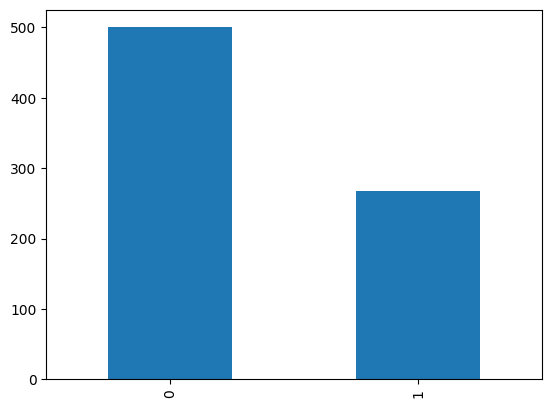

In [ ]:
df["Outcome"].value_counts().plot.bar()

**Label 1 (diabete) is 2 times smaller than label 0 (not diabete) which lead to an imbalance in labels. It is also a problem need to consider**

# Visualize data and Feature engineering

## Visualize numerical columns

In [ ]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Feature engineering

### Investigate the relationship between each numerical feature and target feature

In [ ]:
df.dtypes

Pregnancies                   int64
Glucose                       int64
BloodPressure                 int64
SkinThickness                 int64
Insulin                       int64
BMI                         float64
DiabetesPedigreeFunction    float64
Age                           int64
Outcome                       int64
dtype: object

,Pregnancies,Outcome
16,17,1.000000
15,15,1.000000
14,14,1.000000
9,9,0.642857
11,11,0.636364
8,8,0.578947
7,7,0.555556
13,13,0.500000
12,12,0.444444
10,10,0.416667


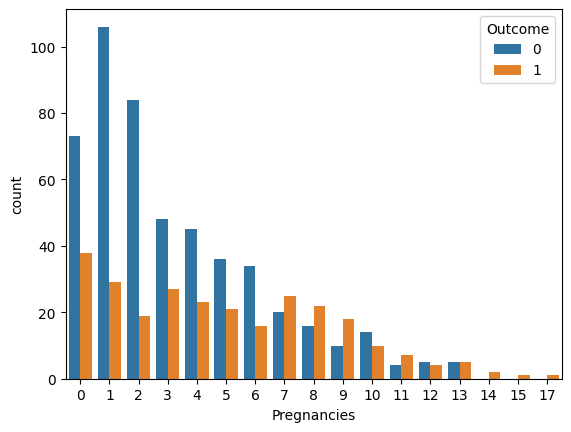

In [ ]:
sns.countplot(x="Pregnancies", hue="Outcome", data=df)
df[["Pregnancies", "Outcome"]].groupby("Pregnancies", as_index=False).mean().sort_values(by="Outcome", ascending=False)

In [ ]:
for column in df.columns:
    if column not in ["Pregnancies", "Outcome"]:
        print(column)
        print()
        print(df[["Outcome", column]].groupby("Outcome", as_index=False).mean().sort_values(by="Outcome", ascending=False))
        print("*" * 30)

Glucose

   Outcome     Glucose
1        1  141.257463
0        0  109.980000
******************************
BloodPressure

   Outcome  BloodPressure
1        1      70.824627
0        0      68.184000
******************************
SkinThickness

   Outcome  SkinThickness
1        1      22.164179
0        0      19.664000
******************************
Insulin

   Outcome     Insulin
1        1  100.335821
0        0   68.792000
******************************
BMI

   Outcome        BMI
1        1  35.142537
0        0  30.304200
******************************
DiabetesPedigreeFunction

   Outcome  DiabetesPedigreeFunction
1        1                  0.550500
0        0                  0.429734
******************************
Age

   Outcome        Age
1        1  37.067164
0        0  31.190000
******************************


**Overall, diabete people have higher mean diagnostic measures than non-diabete people.**

# Train-Val-Test Split

**I will split the entire dataset into 3 parts:**
1. Training set: this part will take up to 80% of the original dataset
2. Validation set: this part will take up to 10% of the remains
3. Test set: is the rest

In [ ]:
data_train, data_test = train_test_split(df, test_size = 0.1, random_state = 42)
y_train = data_train.pop('Outcome')
y_test = data_test.pop('Outcome')


print(f"Data train: X_train shape {data_train.shape}, y_train shape {y_train.shape}")
print(f"Data test: X_test shape {data_test.shape}, y_test shape {y_test.shape}")

Data train: X_train shape (691, 8), y_train shape (691,)
Data test: X_test shape (77, 8), y_test shape (77,)


# Model results storage

- Create a dictionary to store scores with different models and can then be used to compare with each other.

In [ ]:
scores_with_different_models = {
    "accuracy_scores": [],
    "precision_scores": [],
    "recall_scores": [],
    "fbeta_scores": []
}

# Model hyperparameters storage

- Create a dictionary to store model's hyperparameters after searching.

In [ ]:
hyperparameters_storage = {
    "LightGBM": None,
    "CatBoost": None,
    "XGBoost": None
}

# Training models

## Prepare model evaluation metrics

- Because diagnosing an illness of person is very important, a diabete person is diagnosed normal (False Negative) is dangerous than a normal person is diagnosed diabete (False Positive). Therefore, i will use fbeta_score, which is a general metric of f1_score with recall will be larger weight than precision.

In [ ]:
def fbeta(y_true, y_predict):
    ## Function used to calculate f_beta score
    return fbeta_score(y_true, y_predict, beta=np.sqrt(5))

In [ ]:
def metrics(y_true, y_predict):
    ## Metrics used to evaluate models
    accuracy = accuracy_score(y_true, y_predict)
    precision = precision_score(y_true, y_predict)
    recall = recall_score(y_true, y_predict)
    f_score = fbeta(y_true, y_predict)

    return accuracy, precision, recall, f_score

In [ ]:
def display_metrics(accuracy, precision, recall, fbeta_score):
    ## Show metric results to screen
    print(f"Accuracy: {accuracy:.5f}")
    print(f"Precision: {precision:.5f}")
    print(f"Recall: {recall:.5f}")
    print(f"Fbeta_score: {fbeta_score:.5f}")

## Train model with Kfold technique

In [ ]:
def kfold_training(model, X, y):
    ## Train model on different training sets and evaluate on different valuation sets
    skfolds = StratifiedKFold(n_splits=6, shuffle=True, random_state=42)
    scores = {"accuracy_scores": [],
              "precision_scores": [],
              "recall_scores": [],
              "fbeta_scores": []}
    count = 0
    for train_index, val_index in skfolds.split(X, y):
        X_train_folds = X.iloc[train_index, :]
        X_val_fold = X.iloc[val_index, :]
        y_train_folds = y[train_index]
        y_val_fold = y[val_index]
        model.fit(X_train_folds, y_train_folds)
        y_predict = model.predict(X_val_fold)
        accuracy, precision, recall, f_score = metrics(y_val_fold, y_predict)
        scores["accuracy_scores"].append(accuracy)
        scores["precision_scores"].append(precision)
        scores["recall_scores"].append(recall)
        scores["fbeta_scores"].append(f_score)
        count += 1

    mean_accuracy = np.array(scores["accuracy_scores"]).mean()
    mean_precision = np.array(scores["precision_scores"]).mean()
    mean_recall = np.array(scores["recall_scores"]).mean()
    mean_fscore = np.array(scores["fbeta_scores"]).mean()

    return mean_accuracy, mean_precision, mean_recall, mean_fscore

### LightGBM

In [ ]:
data_train = data_train.reset_index(drop=True)
data_test = data_test.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)
y_test = y_test.reset_index(drop=True)

In [ ]:
lgbmc = LGBMClassifier(num_leaves=100)
mean_accuracy, mean_precision, mean_recall, mean_fscore = kfold_training(lgbmc, data_train, y_train)
display_metrics(mean_accuracy, mean_precision, mean_recall, mean_fscore)

[LightGBM] [Info] Number of positive: 200, number of negative: 375
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000185 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 634
[LightGBM] [Info] Number of data points in the train set: 575, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.347826 -> initscore=-0.628609
[LightGBM] [Info] Start training from score -0.628609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

####Hyperparameters fine-tuning

In [ ]:
def objective(trial, X_train, y_train):
    max_depth = trial.suggest_int("max_dept", 2, 14)
    param_grid = {
        "objective": "binary",
        "metric": ["binary_logloss", "auc"],
        "verbosity": -1,
        "learning_rate": trial.suggest_float("learning_rate", 0.0001, 0.5),
        "num_leaves": trial.suggest_int("num_leaves", 4, 2**max_depth),
        "max_depth": max_depth,
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 5, 200),
        "max_bin": trial.suggest_int("max_bin", 10, 255),
        "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
        "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
        "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
        "feature_fraction": trial.suggest_uniform("feature_fraction", 0.1, 1)
    }

    score = model_lgbm_cv(params=param_grid,
                        X_train=X_train,
                        y_train=y_train)

    return score

In [ ]:
def model_lgbm_cv(params, X_train, y_train):
    train_data = lgb.Dataset(X_train, y_train)
    result = lgb.cv(params=params,
                    train_set=train_data,
                    num_boost_round=300,
                    nfold=5)
    print(result)
    return result["valid binary_logloss-mean"][-1]

In [ ]:
study = optuna.create_study(direction="minimize")
study.optimize(lambda trial: objective(trial, data_train, y_train), n_trials=50)

[I 2023-09-08 03:00:30,626] A new study created in memory with name: no-name-8fbfe4c1-328b-4e8c-be09-41aaf37180b0
<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-2

{'valid binary_logloss-mean': [0.6111659363963066, 0.587250185802975, 0.5679236133087113, 0.5553730585289578, 0.5445428594408567, 0.5355671804325478, 0.5275345242104127, 0.5204396525789466, 0.5164882669717373, 0.5113695402959062, 0.507416326893146, 0.5042301241441537, 0.5019682104344403, 0.4996834168637546, 0.49741640100671847, 0.49586337313943074, 0.4936985876132954, 0.49189271891269437, 0.49116530002179787, 0.49002802766811404, 0.48951509112639596, 0.48845782850279296, 0.48809102189136694, 0.48747802386274464, 0.48709987506300595, 0.4868002606461216, 0.4860711662860999, 0.4856657280190465, 0.48544027028552506, 0.48546726582841704, 0.4852023985821675, 0.4850189481223037, 0.4850726873147617, 0.4850023733510473, 0.4848961742303288, 0.4847874081691613, 0.4847874081691613, 0.4847874081691613, 0.4847874081691613, 0.4847874081691613, 0.4847874081691613, 0.4847874081691613, 0.4847874081691613, 0.4847874081691613, 0.4847874081691613, 0.4847874081691613, 0.4847874081691613, 0.4847874081691613,

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6465234051665549, 0.6418925497784753, 0.6412551424517587, 0.6341442113845137, 0.6324836233271973, 0.6321399975801671, 0.6316082369121739, 0.6279473586108775, 0.6278535684629618, 0.6239345174121481, 0.6234303625061585, 0.6173863313150559, 0.6160996247322255, 0.6158026482245529, 0.6154362233524308, 0.6123147263240408, 0.6122685632526152, 0.6091400700391455, 0.6086617745902942, 0.6029068079143769, 0.6019366422536824, 0.6017321535415183, 0.6014869730310185, 0.5988125653452073, 0.5988000932041986, 0.5960622713248894, 0.5956662565437145, 0.5910820344028427, 0.5903306815869791, 0.5902161463440516, 0.5900591304980128, 0.5877623539206034, 0.5877743303047485, 0.5855088158504215, 0.5851936324938417, 0.5811808943923484, 0.5806020204711005, 0.5804937926731708, 0.5804004468154715, 0.5783434237352207, 0.578373999654187, 0.576416739875166, 0.5761038784884966, 0.5720002605307918, 0.571462461964989, 0.5713888736187286, 0.5713404182988582, 0.5696854549080548, 0.5697323585

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6462672219508757, 0.630751017025373, 0.6290788120534031, 0.6065026466836813, 0.6028601641944611, 0.6021133528961948, 0.6013679233021307, 0.590946884284292, 0.5910321752468792, 0.5833743116698563, 0.5824716914708188, 0.5678802319899242, 0.5666512929432329, 0.5664274833770888, 0.5663954394951018, 0.5601198927597117, 0.560269071694869, 0.5561306852744252, 0.5554105821845022, 0.5471878654668493, 0.5467100365603331, 0.5467142741128598, 0.5467142741128598, 0.5425254032993359, 0.5426206934666309, 0.5403723391738408, 0.540062827370044, 0.5321150399649281, 0.5320275854821531, 0.5320313527356901, 0.5320313527356901, 0.5295787189477392, 0.5296511515915799, 0.5283257511326493, 0.5279772559328064, 0.5234309049205557, 0.5234613776770953, 0.5234613776770953, 0.5234613776770953, 0.5219661973710379, 0.5220285538684902, 0.5212942993804865, 0.521074522489613, 0.5178974447903938, 0.5179212488690836, 0.5179212488690836, 0.5179212488690836, 0.5168109933398203, 0.516871802470

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6454478850717681, 0.6438234746860465, 0.6433052346287808, 0.6421843659574442, 0.641624789839769, 0.6394099471008212, 0.6372549009492128, 0.6357819054207797, 0.6353056987719359, 0.6332072271484191, 0.6311793483871387, 0.6292087748198011, 0.6286016852813316, 0.6264948062854235, 0.6244635040013395, 0.6224648744297782, 0.6220002929098173, 0.620188241236509, 0.6197957613351275, 0.6187953973819933, 0.6174720525815045, 0.6157246669496322, 0.6139185666668888, 0.6126704593440023, 0.6117353563926173, 0.61091609950541, 0.6104933397403755, 0.608711234745072, 0.608316164264629, 0.6067065535666817, 0.6055376237184718, 0.6047383275008085, 0.6031406341263726, 0.6020516188127846, 0.6005423805840574, 0.5994384606747383, 0.5991605107791863, 0.5976202511234596, 0.5968209916756407, 0.5952352315789619, 0.5949377490754366, 0.5935939808425855, 0.5933074388938129, 0.5918921873471285, 0.5905758939861145, 0.5890964050597263, 0.588414942564198, 0.5877708665227264, 0.58749376696988

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.5969353884028672, 0.5749022201081015, 0.5611876254965821, 0.5353384224716295, 0.5181788401710244, 0.5119773405749573, 0.5037836720481839, 0.4973759863381737, 0.49594456742964843, 0.49121531231190463, 0.4892810918826832, 0.4888393048989217, 0.48656423259491816, 0.485151618911262, 0.4860705218239344, 0.48727135222853885, 0.48541116688271757, 0.4848632614171112, 0.48387697576950056, 0.48453703423140715, 0.48532161896696324, 0.484593250501595, 0.48463856163914254, 0.4843406925452629, 0.4852151298834825, 0.4861685883551532, 0.4873881482130469, 0.4881288929943045, 0.4875693401380857, 0.4888718491678404, 0.49040629447025763, 0.4910374641232946, 0.49199461438236136, 0.4923379478996873, 0.49315990786031944, 0.492678220829683, 0.49325339010685615, 0.4937555308172846, 0.4936256514415974, 0.4948569716767362, 0.4955380500892363, 0.49648504894551476, 0.4973808642479316, 0.4982139122330089, 0.4986810708633259, 0.49935372183663684, 0.49993528939495546, 0.50127458246759

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6132022072774654, 0.5901977151730167, 0.5721381533990915, 0.5575863060742421, 0.545595088580542, 0.5352481125611943, 0.5273317491697339, 0.5193899389271744, 0.5146918291834317, 0.5083578285338997, 0.5051444382328247, 0.5003068958076299, 0.497154023059713, 0.49418246432423396, 0.490843809201157, 0.48910406563583775, 0.4875436089503893, 0.4863841808739157, 0.48533966091662994, 0.48368666371820374, 0.4824021699691364, 0.4818088796464991, 0.48048577163874284, 0.4795209821582551, 0.47881363982104796, 0.4782588546150719, 0.4771995693189037, 0.47672710243835337, 0.47637292883596183, 0.4761303831940336, 0.4756429713260859, 0.47555716430915823, 0.47515630487792004, 0.47446451707201015, 0.47452222819526374, 0.47444662988737, 0.4742139810660381, 0.47383361588572004, 0.4737545215279071, 0.47363872698221127, 0.4733322526710856, 0.4727989517700334, 0.47295763206137514, 0.4727970280027073, 0.4726440387347376, 0.4725314248442878, 0.47253255991505966, 0.4724985342989810

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6272206686666019, 0.6102880976028967, 0.5965310680630376, 0.5836724367060515, 0.5730260201965478, 0.5657286287617661, 0.5565005613645672, 0.5484647404442218, 0.5431325100981024, 0.5364869375361458, 0.5305835730537998, 0.5246191548822744, 0.5190878331966824, 0.5145611061329977, 0.510821393157167, 0.5075235133819544, 0.5034270645313629, 0.5008408782809166, 0.49845957233311006, 0.49530597157189094, 0.49386337897405025, 0.4926045855230222, 0.4911661277992616, 0.49043926376501223, 0.4889597544358522, 0.4879258424303184, 0.4878215263016116, 0.4867150732845724, 0.48571524755132023, 0.48431375754953365, 0.48408801509768284, 0.48393412330692814, 0.4833472438797323, 0.48322854765986634, 0.48270401299012783, 0.4821847037327739, 0.48216249049913074, 0.481927029264743, 0.4815468837525959, 0.48094993562371224, 0.4807528061057834, 0.48015548196149205, 0.480494151178957, 0.4800030156785948, 0.479690489420153, 0.47988997802488303, 0.4799100662451215, 0.4797815785741305,

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6300252416591883, 0.6206630464766093, 0.6130252798866861, 0.6002919114058949, 0.5897839411246413, 0.5849744247473131, 0.5756917728314812, 0.5677855031494089, 0.5624527025679679, 0.5561493580315627, 0.5504152537698886, 0.5465246205528864, 0.541704838054916, 0.5378058351726858, 0.5337136436876964, 0.5306734255125664, 0.5276774693597399, 0.5254446766126589, 0.5237453690514837, 0.5208748872324029, 0.5183991665976493, 0.5164870610019199, 0.5143941095570554, 0.5129987332146364, 0.5110027377905296, 0.5092093210647259, 0.508184065951216, 0.5066437782743387, 0.5050965016802901, 0.5038594416865452, 0.5029300871019702, 0.5018939323414439, 0.5008817799087951, 0.5004690051087293, 0.4991765086893062, 0.49840692113077545, 0.4977631209461911, 0.49709990240617474, 0.4963942303749073, 0.4963262687128265, 0.49549136517889886, 0.4948586365014517, 0.4942531908603824, 0.49381043443707223, 0.49339709501551343, 0.4930623178740746, 0.4927899679362544, 0.4925955012322752, 0.4922

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6438178812493537, 0.6325849575124948, 0.6297916478962032, 0.6249074149924236, 0.6138589065122947, 0.6031271057967721, 0.6007657757196663, 0.5926261872601992, 0.585903458344612, 0.5818725332799696, 0.5747865923383743, 0.5713145472190574, 0.5650520040036617, 0.5614876439399943, 0.5586937913988331, 0.5535617001994441, 0.54847447053414, 0.546155258952563, 0.5416328525567802, 0.5397831699464456, 0.5379541174812592, 0.5346737341739223, 0.5311715101168233, 0.5293259329036187, 0.5289517593915323, 0.5256763304071621, 0.5245789382168669, 0.5235743722948473, 0.521473221833383, 0.5208053162103484, 0.5199709115703701, 0.5187362666022562, 0.5177498989524736, 0.5169675494976604, 0.5144126324757254, 0.5137260165044072, 0.5126151593568752, 0.510721374469831, 0.5087052564503463, 0.5078134272799467, 0.5068448415477219, 0.50660602944377, 0.5064502255078551, 0.5065003905595147, 0.5049709803251127, 0.504671771048015, 0.5029295409638763, 0.5027211215641922, 0.501310596300883,

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.5662650172543231, 0.5233500758813661, 0.5070016740958737, 0.4962619671058782, 0.4868224902828106, 0.4857953961551374, 0.483591831325877, 0.47971248326708926, 0.47813273526857947, 0.4766615085978323, 0.47529541951989007, 0.4745946575881871, 0.47344311364318603, 0.47227332112296805, 0.4732705726379042, 0.47319547670293155, 0.4745662034508783, 0.4763505502105315, 0.47572924205247136, 0.476184703377905, 0.4753754759003515, 0.4748243476491525, 0.4747728382698139, 0.4763118477015988, 0.4778100650658139, 0.4773308094755346, 0.4777157322501768, 0.47762622260917914, 0.4782507017331915, 0.4787419413216769, 0.4786191407620546, 0.479016291255173, 0.4795096084732749, 0.47899668036811266, 0.47897657628302676, 0.4794760633047792, 0.47964613134510226, 0.47986488989728204, 0.4798554528512889, 0.4801733538585521, 0.480087354601941, 0.4800881733896164, 0.480088667193559, 0.4800861727318885, 0.48008651697292254, 0.4800849702814512, 0.480085200908121, 0.480084235864341, 0.4

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6242725736127894, 0.6065898883811786, 0.591917352437161, 0.5793869290432284, 0.5696762759120106, 0.5614086906903987, 0.5529728891995236, 0.5456473897111002, 0.5400838479612277, 0.5344071296018639, 0.5292576611390694, 0.5256812986492085, 0.5215637636153885, 0.5193920703473802, 0.5153462391269421, 0.5129992412168716, 0.5108977267901476, 0.5088849000596358, 0.5066423901509929, 0.5043995542756996, 0.5029611607365798, 0.5018187509383784, 0.49987671402815365, 0.4986104506189585, 0.49731364107142867, 0.49618097200422523, 0.4952590250244172, 0.49396113689230303, 0.49300009730735717, 0.49211209835222414, 0.4915836935180723, 0.4909630308472509, 0.4899688219366177, 0.48953671288930256, 0.4893051692286855, 0.4888219709454854, 0.48810827691694103, 0.48789496209431976, 0.4871150956912548, 0.48669177749996084, 0.48668585847167983, 0.4862472983062567, 0.48605771490410143, 0.48576530938305174, 0.48520625163764974, 0.48503737435077443, 0.48477164189949973, 0.484545906709

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6178325728820708, 0.5990720444157954, 0.5897563928503314, 0.5707190931662524, 0.5556445437828087, 0.5505516065366354, 0.5379379090723899, 0.5346711872437291, 0.5290118193545286, 0.5202522754145894, 0.5134730993925858, 0.5119189583692302, 0.5095695247418429, 0.5041467378479405, 0.5000568707534463, 0.4988766958180809, 0.49498255140363245, 0.491716114133678, 0.4906957591999124, 0.4887451212217358, 0.4862643511962167, 0.4860245600985623, 0.48517656437074913, 0.4849658819981844, 0.4838511407941092, 0.4825146324474752, 0.48279375908620353, 0.48221279660906075, 0.4819453901916642, 0.4813075921586819, 0.48151397246888916, 0.48128900503073907, 0.48188044486953896, 0.4815383810337094, 0.48156225551110693, 0.48128909124720065, 0.48078057033114546, 0.4813110733420706, 0.48127754240781134, 0.4814170958973195, 0.4818144626236257, 0.4817896083664162, 0.4816862636091459, 0.48150194774599325, 0.4821200937111872, 0.4824852850738983, 0.4824699734967486, 0.4827417239677237

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6454156879827337, 0.6406923803841547, 0.6394444904315228, 0.6373717349781767, 0.6325131645437724, 0.6279014708882567, 0.6267563219316653, 0.6226417362795293, 0.6188268851703225, 0.6166081525503978, 0.6128279081605921, 0.6107573894804326, 0.60675682006074, 0.6049194848440627, 0.6033778390366402, 0.6003476913604306, 0.5969415152417462, 0.5952411288831726, 0.5920584413378955, 0.5904183401789398, 0.5888982311576296, 0.5862466295124862, 0.5828262048499562, 0.5814462551035182, 0.580847372825978, 0.5778810597365109, 0.5766973699798238, 0.5753414538413362, 0.5734544601100201, 0.5723164132641945, 0.5713299621636524, 0.5701823228667913, 0.5691228386759255, 0.5680527869961456, 0.5655206662343287, 0.5645355501178504, 0.5635404390758894, 0.5614977400551248, 0.559293478482965, 0.5583769980316892, 0.5569733133224972, 0.5562007762400796, 0.5558370121402191, 0.5555610781207362, 0.5533832699795094, 0.5526478542343071, 0.5506383330206832, 0.5498557071920036, 0.54798314258

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.621292052145988, 0.6044943833088243, 0.5959442186100263, 0.578185001224256, 0.5642485058052131, 0.5586185391784448, 0.5482339278247833, 0.5441547578255005, 0.5392401967881695, 0.5312372841146697, 0.5239745675341873, 0.521599692616306, 0.5184990429747771, 0.513897536399661, 0.5094952914598045, 0.5072981870534773, 0.5041057723460074, 0.5015426557799908, 0.4993763536419987, 0.4974250736224387, 0.49441054184813826, 0.4938290917820619, 0.4926820475371422, 0.4919629407104232, 0.4910866642900868, 0.48967396999067514, 0.48942972891564357, 0.4884815590464113, 0.487993204145501, 0.4874466485164349, 0.48746396839998074, 0.4865936154455851, 0.48593297234545085, 0.48524898002728695, 0.4849648307151672, 0.4847975206396643, 0.4840811039717197, 0.484434701621063, 0.4844789490216151, 0.48368119984469526, 0.4837462143249572, 0.4837920896197169, 0.48434385556380527, 0.48391159365208125, 0.48385578862394657, 0.4840996727597197, 0.48402712157518285, 0.4840834206109739, 0.48

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6346654544276081, 0.6238420120104651, 0.6144500495926234, 0.6065197660569457, 0.5986866656002867, 0.5929723035769855, 0.586824529534044, 0.5808905559401689, 0.576183598179836, 0.5704459980490943, 0.5660531129879631, 0.561382206689352, 0.5572064026179024, 0.5533895815412371, 0.5496781884386398, 0.5465811612177841, 0.5430365301607825, 0.540062333744461, 0.5376161482713069, 0.5342867385681835, 0.531576639820176, 0.5289971015945845, 0.5270927383834392, 0.5254041509582232, 0.5236023866394314, 0.5220714536352179, 0.5199678350311335, 0.5183314456844299, 0.5175612977464966, 0.5163684644473758, 0.5150521207588057, 0.51356770609684, 0.5126220636729442, 0.5114814615584727, 0.510663458869294, 0.5093794819292101, 0.508934684347531, 0.5080672004126505, 0.5071975401317571, 0.5067819789907794, 0.5059904874574486, 0.5054578815942369, 0.5046319432798827, 0.5038535956575986, 0.5031813280827773, 0.5025032812169767, 0.5019630340260784, 0.5015014488907579, 0.5008002582146627

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6462839798896549, 0.6460228784403748, 0.6457627392621609, 0.6453734987510558, 0.6449857370553169, 0.6448194367315325, 0.6444695644937102, 0.644089955673655, 0.6438336470379153, 0.6435383070182591, 0.6431566202237716, 0.6429022677612716, 0.6425579536453251, 0.6421727693597618, 0.6417916614015137, 0.6415453189177297, 0.6411702976618221, 0.6408816288283006, 0.640637181545012, 0.6402678319446702, 0.6398904107385659, 0.6396376751080314, 0.6393028602365846, 0.6389695476266487, 0.6386051827724664, 0.6382398220499773, 0.6379866563807475, 0.6376166552366488, 0.6372480257877224, 0.6368912314177684, 0.636640659979058, 0.6362857094803152, 0.6360365205339644, 0.6356794370732699, 0.6353196271983048, 0.634968963794992, 0.6346092572217832, 0.6342508765601191, 0.633893815972099, 0.6335759805445076, 0.6332236289504988, 0.6328702334772546, 0.6325204489660475, 0.6321793245409786, 0.6318296846380478, 0.6315326748337573, 0.6311760101037704, 0.6310262501062873, 0.630680572958

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6393572694179348, 0.6139191928456955, 0.6088238127024175, 0.5991074656912476, 0.5805914978042914, 0.566540318578489, 0.5636880996186869, 0.5524352170152828, 0.5436387902573433, 0.5389070208436844, 0.5314647388447896, 0.5277356287113053, 0.5224788141850752, 0.5185076195331162, 0.515447287020161, 0.5119591768622861, 0.5090662834856537, 0.5071557964103546, 0.5041399316468091, 0.5032593629082951, 0.5020492171985358, 0.49995926968438564, 0.4972394934598765, 0.4962699382095968, 0.49633142350619613, 0.4942364023819817, 0.49365840919715653, 0.4933842038832819, 0.49231709781436345, 0.49229622689633806, 0.4920651679153346, 0.4917434738686793, 0.4920879450284449, 0.4920413097519966, 0.4913086669769863, 0.4913247207011616, 0.4907801960201702, 0.4896416427279247, 0.48873080345240866, 0.4886447502800227, 0.4883834545664884, 0.488354570050434, 0.48861162108164374, 0.48865784844118804, 0.4881983595239149, 0.48832941387541745, 0.48782000586708907, 0.48791626158347945, 0

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6212044901526703, 0.601482590712728, 0.5859376078717978, 0.5735138842835125, 0.5623451226886319, 0.5548354146932886, 0.5463365971229128, 0.538681249850814, 0.5333775929705802, 0.527631305618802, 0.5226527718152812, 0.5168424814875492, 0.5131194103190915, 0.5088923297626741, 0.5054127710416849, 0.5023295956200268, 0.49916541858481606, 0.4971939050776218, 0.4946741669893825, 0.4926808595280745, 0.4916152207998722, 0.489701989523764, 0.48836220646177936, 0.4874201556973956, 0.486090931663973, 0.4855539567066554, 0.4852555302623681, 0.4840654372651632, 0.48331162413924644, 0.48296935925718215, 0.48241882806227476, 0.48201578893679936, 0.48110179044835216, 0.4811524543813873, 0.48041448813469156, 0.4799816607681925, 0.47946917080081636, 0.47960431466832665, 0.47921184564109165, 0.4787698594980429, 0.4785910313623636, 0.4785323789744055, 0.47834184653080036, 0.4773958818822842, 0.4777679380885795, 0.4775984907895097, 0.47705722259123917, 0.4770351051888365, 0

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6294582431060876, 0.6150236329143732, 0.6024841759638087, 0.5922332192589437, 0.5825942002681439, 0.5756824674191227, 0.5679365487732794, 0.5612985906790635, 0.5558606075121049, 0.5499087846309842, 0.5454354001015881, 0.5394195270551034, 0.5348086897632808, 0.5304675942107732, 0.5268144467436893, 0.5228916848692241, 0.5197367051307408, 0.5168750905442554, 0.5135287393992173, 0.5113129113371226, 0.5098362636092867, 0.5077017913803112, 0.506139531753417, 0.5045583531407687, 0.5027714446680014, 0.5019449592562564, 0.5012669234367059, 0.49999608574017984, 0.49902214446955584, 0.4977063912766038, 0.49733976997728596, 0.49634840003273606, 0.49550411093095237, 0.49433323922847333, 0.49370494953047855, 0.49272209736815764, 0.49242056681863194, 0.4922317624059936, 0.4915865224184285, 0.4910563932379236, 0.4908479070803594, 0.4903708974854893, 0.4902909897952921, 0.4901961133543623, 0.48962135195317186, 0.48875670517007475, 0.4883942396885989, 0.48834172105308493

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6052094531662269, 0.5851426210895353, 0.5665424052045548, 0.5483796992307821, 0.5335406319498386, 0.5261128887415033, 0.5191682242469116, 0.5140723095936645, 0.5083889035317932, 0.5045246018252251, 0.500962927622525, 0.4976472350525719, 0.49507394698431806, 0.49452955056387893, 0.4937721662833877, 0.4930150157780277, 0.4916957318659293, 0.4916650129287373, 0.4904880119904832, 0.48951482266227825, 0.48903362149644725, 0.48945700778785967, 0.4884027985414646, 0.48884320644460005, 0.48804016540094297, 0.48808864834268106, 0.48781170828489434, 0.4877917889356726, 0.4879410272494251, 0.4886279672688626, 0.48834638198504055, 0.489088720949837, 0.48947067863126276, 0.4895659354095037, 0.48951083807915435, 0.48943553934938483, 0.4894668278225895, 0.4897331613312019, 0.49029055861981374, 0.49028889182112695, 0.4909082800747127, 0.4904495998568973, 0.49070406872810934, 0.4907170853164663, 0.49062442337800516, 0.49062197863845575, 0.4907607848031386, 0.49098061162

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6323005833362554, 0.6197639534136045, 0.6087113585650802, 0.5990687432645916, 0.590031043247427, 0.5841485117848736, 0.5774577962655778, 0.5713371684678537, 0.566257431209305, 0.5606750090698562, 0.554931202090476, 0.5494823778861653, 0.5454802339873193, 0.5416254093588201, 0.5375446022925151, 0.5343064024963597, 0.5309713410248258, 0.5279326010531598, 0.5251766866312112, 0.5223547473832713, 0.520153883862657, 0.5178115235625969, 0.5164382690362819, 0.5139227506076914, 0.512075272800137, 0.5104765699710709, 0.5088931771818227, 0.5072961625941841, 0.5058769776919211, 0.5047022622035393, 0.5034529088318208, 0.5024085917204378, 0.5009490553405302, 0.49993382665495484, 0.49894491200925495, 0.49792758226438477, 0.4972090746887915, 0.4962994723811711, 0.49534899952853245, 0.49471427401936907, 0.4944207217771395, 0.4938546955289634, 0.49332941459626267, 0.49273600885616914, 0.49210664546505756, 0.4916334128864519, 0.4912667795402349, 0.49112117272468747, 0.490

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6221038050226767, 0.609843067328225, 0.5996883960221574, 0.583200899223049, 0.5719328532610676, 0.5667413946690394, 0.555510556891621, 0.546519281022473, 0.542078542763614, 0.5348841690957947, 0.5292037552419128, 0.5256825857553432, 0.5202658891451521, 0.5158315619199768, 0.5119827966197169, 0.5102579547331536, 0.5073577902896329, 0.503904977700934, 0.5021979851662264, 0.4994322566984226, 0.49762115226429077, 0.49638536479702255, 0.4943656221285087, 0.49297296874611735, 0.4919084138400563, 0.4902155710162342, 0.48941467489194873, 0.4883606968127707, 0.4871894068642444, 0.48660594199183393, 0.48618975155979083, 0.4854271744852475, 0.48487344291328727, 0.48464354138295285, 0.4841644236984661, 0.4834423423001521, 0.4833257204206628, 0.48329621765934255, 0.48304838928079274, 0.4826519811304034, 0.48279035707988427, 0.4824852814833437, 0.4825882359104553, 0.48237873372499945, 0.4821490043654354, 0.4822780251402944, 0.4819631943896871, 0.48214280995066455, 0.

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6348359877641913, 0.6276513261235882, 0.6212154934368129, 0.6115003101265337, 0.6024027131622824, 0.598560655220114, 0.5913380238001198, 0.5842783036324725, 0.5795893004116888, 0.5737282363043109, 0.568321494111674, 0.564663789564074, 0.5594369836172337, 0.5545457025399583, 0.5501841214582488, 0.5472446581389484, 0.5431290824440161, 0.5395972728780858, 0.5373745264610321, 0.533919451870754, 0.5309953597746693, 0.5289675515118256, 0.5260673330313221, 0.5234103971621599, 0.5205837122992519, 0.518226286033809, 0.5169677916973262, 0.5148889717959223, 0.512806088556862, 0.51081487227869, 0.5097069848101807, 0.5076215734848953, 0.5065550852565754, 0.5047540588219717, 0.5030664875491226, 0.5016253371687311, 0.5002446366666857, 0.4987917892833279, 0.497713778026547, 0.4967125918163336, 0.4954023832516339, 0.4943398743589369, 0.49338254398208037, 0.4921245869458236, 0.4913193648533907, 0.49060030652190445, 0.48958285102621446, 0.48942210941538755, 0.488803934712

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.611893282409503, 0.5878045930069262, 0.5706453145358287, 0.5552829585831972, 0.5428758520207386, 0.5344229038458961, 0.526662308556427, 0.5181673297646584, 0.5130959163618337, 0.5077658249902857, 0.5034532994474098, 0.4992183722738838, 0.4952494647061174, 0.4928496134034065, 0.48987461767723134, 0.4866270768917815, 0.48498499159782693, 0.48380196286203514, 0.4815275692114548, 0.48068329103959506, 0.47889605472766783, 0.47818355838891646, 0.47718707244183145, 0.47692289078794153, 0.4762016112081454, 0.47545172178480116, 0.47468603146062865, 0.4742542750796961, 0.47297603004866184, 0.47289689108194216, 0.4729120191991944, 0.4728196034584137, 0.4723999592976945, 0.4722230445706665, 0.4721909442638639, 0.47212955846753646, 0.47189921744165114, 0.4720348511538387, 0.4719623556476452, 0.4718869537187074, 0.47174691862772705, 0.4716529870498004, 0.47169023874065485, 0.47165432681996117, 0.4721698514848308, 0.4723059866485812, 0.472059855904858, 0.4718800677698

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6122496673575171, 0.590160896934907, 0.5716063090061848, 0.5568158410057551, 0.5448118963044517, 0.5366448489770894, 0.5294417340020273, 0.5215629266782678, 0.5155912229471349, 0.510084976061018, 0.5059683223348748, 0.5022094708069901, 0.498371367600686, 0.4942791584993179, 0.49350066692125755, 0.4910420079723587, 0.48870656157109493, 0.488225768337054, 0.4876191075837232, 0.48615198543883176, 0.48487481799564336, 0.48475349352990343, 0.4835813164018784, 0.4830740823222223, 0.4827568476418704, 0.48193290512085446, 0.48110884560923867, 0.48084830714940835, 0.480127479080145, 0.47987759801624713, 0.4803522697302559, 0.4801682672019222, 0.47992693697026995, 0.47906655927598046, 0.4792641790359059, 0.4784230340467765, 0.4786600246481651, 0.4784140838624462, 0.4779151709540484, 0.4775028115031178, 0.4773025207168688, 0.47742488012598044, 0.47725298399140215, 0.47731745938307124, 0.4772543933620289, 0.4773065002626381, 0.4776454469299402, 0.4782095471881126, 

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.607995998425526, 0.5842633695784171, 0.5658613654344438, 0.5534693146019938, 0.539692208050629, 0.5318445394049245, 0.5238563665605243, 0.5163349480405754, 0.512461251988438, 0.5070783906996599, 0.50153853152623, 0.49682673648174946, 0.49413899847324183, 0.49198560417975357, 0.4890137611469644, 0.487626198658894, 0.4866020008094833, 0.4858102302314456, 0.48383916630381396, 0.48344382121228174, 0.4826102017138874, 0.482237331340313, 0.481112111306397, 0.47935762940017207, 0.47899085015106796, 0.47882214937422035, 0.47978744026222964, 0.4790647968491232, 0.4789865983732505, 0.47843950644284916, 0.4782276898021089, 0.4777527199211652, 0.4777216881417761, 0.4772448764508438, 0.47789421250040504, 0.47826287848499643, 0.4780507802917985, 0.4777422478088512, 0.4769015733926148, 0.4765231140155284, 0.4760918254464059, 0.4766131069263221, 0.47685505034786085, 0.476465789185454, 0.4759618041879043, 0.47602569311894427, 0.4755394241933607, 0.4754653548725651, 0.47

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6142085049370853, 0.589793307631963, 0.5731736943809616, 0.5589293453282439, 0.5464895287161505, 0.5383958718736708, 0.5293827055910238, 0.5217167916630421, 0.5168548375947151, 0.5102241777286614, 0.5045861812078574, 0.5006144506184329, 0.49705248144147374, 0.49341101203251386, 0.4907013855735879, 0.48832077595399603, 0.4857741975112856, 0.48479751261925746, 0.4829076230550907, 0.4820735953847673, 0.4810607632457581, 0.4806688367314235, 0.4793957270803212, 0.4784143233577705, 0.477929439425483, 0.4777013476045532, 0.47723673664133115, 0.47672826850090033, 0.4765581868860599, 0.47661245846823536, 0.47693090702059865, 0.47672939872396364, 0.476557000412103, 0.47614881011103793, 0.4761981260839292, 0.4754535285323784, 0.4759377058260738, 0.47605748351799476, 0.47636612867698114, 0.4757497805482025, 0.47591127232472996, 0.47599728977976274, 0.47620338469709067, 0.47606597728178557, 0.4759980517325852, 0.47613840781692496, 0.47627154134404837, 0.476482188078

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6010415478739788, 0.5752835385812449, 0.5552579835479533, 0.5419948244436863, 0.5300794175725747, 0.5207978243190696, 0.5127616207166252, 0.5060362851727336, 0.5028654602428017, 0.4986643544194411, 0.4954954376339444, 0.4921539783234077, 0.4903428222509955, 0.48924726543106545, 0.48754784301526966, 0.48584319578297663, 0.4846035845881319, 0.48352588296932497, 0.482813599590707, 0.4823159832460699, 0.4823335956762259, 0.48141938870165263, 0.4808988475867887, 0.480037407790609, 0.4795150753831626, 0.4795250558696115, 0.47990025403681413, 0.47949801481141885, 0.47924360814897177, 0.47874389613663126, 0.47887024792301913, 0.47859713007192584, 0.4784745836539333, 0.4783485898035359, 0.47882180047544604, 0.47864224148684054, 0.4786438157840472, 0.4788065579237684, 0.4787256505952418, 0.478226047810934, 0.47812676967057105, 0.4788302985078907, 0.4791505574552435, 0.47945711452662154, 0.47923685425469287, 0.47943562376631765, 0.4792802244193539, 0.4789824310499

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6108795210398301, 0.5851104367710573, 0.5653549769387931, 0.5495337439886624, 0.5367053557568611, 0.5290495527304323, 0.5230122470594083, 0.5156203447116661, 0.5103313782320994, 0.5049435449264574, 0.5011468766705807, 0.49850345152674846, 0.4952272184667848, 0.49283578467626576, 0.4916775892648865, 0.4898923578146316, 0.48813917828593334, 0.4870768794696868, 0.48536708688234337, 0.48417266461375685, 0.48423236264856734, 0.48367139665874204, 0.4834426812788461, 0.482880187610469, 0.4828186545576754, 0.48272541268839386, 0.48356545247307636, 0.48318509050921704, 0.48365952123547834, 0.48361264183837827, 0.48344065229965094, 0.4833765895880113, 0.48332692007937794, 0.48299175076018946, 0.483310921754844, 0.4830387858703655, 0.4833531395139371, 0.48307050827084747, 0.48324038414241965, 0.48363593543545863, 0.4836739662244442, 0.4841478412678201, 0.48404309407106016, 0.48367024225709604, 0.48386813023061237, 0.4838319789746722, 0.4834178004896906, 0.48380196

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6199547989685856, 0.5988417439799275, 0.5816206315965969, 0.5674814742887989, 0.5543339354579311, 0.5446765842643391, 0.5362267231233278, 0.5286874782942373, 0.5233256784171872, 0.5166142793472506, 0.5110113535025081, 0.5068143867017245, 0.5031858244772464, 0.4999402933403821, 0.49721820822572804, 0.4951300832391423, 0.4929478180566119, 0.4921037644076742, 0.48987591591136903, 0.48894165667678324, 0.487573905251124, 0.48595053439257524, 0.48584649259722534, 0.4846094852417657, 0.48363280112142365, 0.48300345683063817, 0.48240478216768945, 0.48187145009564836, 0.4822798807433835, 0.48214040550990306, 0.48148717675950686, 0.48047990535262014, 0.48027095244285756, 0.4797473103162896, 0.4798993782301282, 0.47975160169395126, 0.479222281252324, 0.4788846267118692, 0.47823704800224753, 0.47807172425355055, 0.47786671068150255, 0.47799215876559725, 0.47800509305213756, 0.4780869212011293, 0.4779201766612486, 0.4777653622687529, 0.47768405797394964, 0.477998711

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6367276701565941, 0.6309976468807712, 0.6257568434088683, 0.6172461124076363, 0.6092470950177612, 0.6057503959476136, 0.5990630227609803, 0.5926100375313333, 0.5887335077416115, 0.5835612002618037, 0.5781861808243687, 0.5749370633328945, 0.5699080263294982, 0.5650636156218252, 0.5606197790052663, 0.5578538493005041, 0.5538744932812804, 0.5504544946509796, 0.5482072754044577, 0.5448187544682769, 0.5417139579432227, 0.5397630194052316, 0.5365525259515527, 0.5337804001924766, 0.5309465056116841, 0.5284234411923954, 0.5268206932886468, 0.5243445313167647, 0.5222134271011193, 0.519899006589852, 0.5189124931425645, 0.5167360415711912, 0.5157591480741187, 0.5138596435046322, 0.5122741315920466, 0.5107867533168278, 0.5095577607063498, 0.5080187502851626, 0.5066350108000643, 0.5053619027015359, 0.5041591079036132, 0.503163732790042, 0.5018898508912677, 0.5005285303565277, 0.4992991420301485, 0.49851976856844277, 0.49753001927999535, 0.49698655897830646, 0.496041

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6248772051442741, 0.6082352678837895, 0.5931315507070856, 0.580375167587588, 0.5703260682473199, 0.5626986641114803, 0.553662469120576, 0.5462423929657512, 0.5412265363909332, 0.5339880014993974, 0.5282082516498721, 0.5226796072512613, 0.5180437526312867, 0.5139866629715176, 0.5108049971768143, 0.5078061317772583, 0.5045992535988513, 0.5029619492743613, 0.5007154685264048, 0.498442959058323, 0.4966755540096822, 0.4949554212376427, 0.4941495797733775, 0.4926375659217991, 0.49126926163191353, 0.49022771699064027, 0.4888569274571844, 0.48761704087939284, 0.48636111623358136, 0.4854030763541416, 0.4848992404661754, 0.4840311596313218, 0.48386696550988406, 0.4835543774405857, 0.48356513027635517, 0.48270952967886294, 0.482330663332409, 0.48191778478078573, 0.4811823624936694, 0.48057589736948947, 0.4806079282394589, 0.4805670055741246, 0.48028226144905795, 0.48021752398010625, 0.4801011403660955, 0.4797399918221468, 0.47958883020760357, 0.4795677533465305, 0

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6192001941995618, 0.5990957794965895, 0.5825834960827675, 0.5701869712455062, 0.559973488758085, 0.5513762059303671, 0.5428303600082289, 0.5346221516840407, 0.5296976807079796, 0.5243111533897625, 0.5199670503121792, 0.5169461264549635, 0.5127266180609737, 0.5102040644178689, 0.5065834584184068, 0.504579932609804, 0.5024640328582943, 0.5008828347258155, 0.4997817681781139, 0.49767591416898993, 0.49669844261285084, 0.4948421201751687, 0.49402645391270095, 0.4923229624981646, 0.4912810767932189, 0.49044527552587824, 0.4903852406782261, 0.4896773443078722, 0.4886879998298145, 0.4881130779044124, 0.4881886072310717, 0.4870663213641845, 0.4867719166003269, 0.48646999048592915, 0.4853682066715385, 0.48490436480783866, 0.48428310252074774, 0.4837513959771644, 0.4834885049349885, 0.48325099918295056, 0.4830082093186784, 0.48287867444615806, 0.48265575918058284, 0.4825308714612305, 0.4819568839838255, 0.48203071559114363, 0.4813411809433923, 0.481182662122584, 0

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6101856046453362, 0.5928341830319065, 0.5812701432426438, 0.5622193088114312, 0.5476095341710423, 0.5415334976538567, 0.5307023304193388, 0.5209448272846289, 0.5167619095057042, 0.5110023051062751, 0.5060156133037295, 0.5032631414183707, 0.49909490460026074, 0.49681989907565616, 0.49439407148404807, 0.4934734896405951, 0.49180188427578564, 0.49032983844507216, 0.4901438186779605, 0.48848050737240667, 0.4871253285674192, 0.48635225128666504, 0.4854976852131525, 0.4854076155121286, 0.48545089597776564, 0.4846011974959715, 0.4848939681147145, 0.48437232148031556, 0.4840697110408124, 0.4833059073329469, 0.4826483406881363, 0.48218469009204606, 0.48173785773662925, 0.4815026384624666, 0.481058783761762, 0.4811298397236693, 0.48069329283558604, 0.48056318694786687, 0.4803836237267344, 0.4804254378575076, 0.48013784250554653, 0.480106190239786, 0.4801421289986078, 0.4799158688419425, 0.4798180974570827, 0.47989696901615037, 0.4797393695787884, 0.47972951073457

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6398329923657299, 0.6334178413740298, 0.6276466583179332, 0.6222121613137542, 0.6173321465995476, 0.613588332369581, 0.6087240883440634, 0.6049387701743549, 0.6016787109411482, 0.5981754097002077, 0.5943118466485395, 0.5915421151948028, 0.5880361018179291, 0.5854418772228024, 0.5823343389320683, 0.5798869436713506, 0.5768242756357121, 0.5746673417795114, 0.5714389429591343, 0.5684537843169757, 0.5660369152800199, 0.5637149097384827, 0.5616206268332558, 0.5590986741563817, 0.5566756796049693, 0.5552140086424313, 0.553580024064988, 0.55208437738296, 0.5495817734126358, 0.5477099789444356, 0.5462921261072348, 0.544754443883563, 0.5434782025227975, 0.541967948011518, 0.5405301207234383, 0.5388144645130387, 0.5371638324398126, 0.5360367705046031, 0.5347629548784472, 0.5334981755969068, 0.5323134259830786, 0.5311565012281845, 0.5302628756252002, 0.5289338278082627, 0.5278818697203829, 0.5270092744904887, 0.5260083187706085, 0.5249667030977855, 0.5243952719437

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6105875327206063, 0.5845341648559617, 0.5669165668711174, 0.553305419479966, 0.541658716343985, 0.5309250792767289, 0.5238313416574079, 0.5162782620414295, 0.5099198537880574, 0.5058053492313027, 0.5028524973572701, 0.49946566202995835, 0.49804740106673806, 0.49549957904515773, 0.49475862790861963, 0.4935298590833234, 0.49310005079624464, 0.49272784472480735, 0.49162310830756617, 0.49099715172385033, 0.48973777235539345, 0.4895432713829712, 0.4892966270657106, 0.4894657584347398, 0.48858272539551895, 0.4886971340043768, 0.4886304444078974, 0.4887641686658067, 0.4883753303469175, 0.4874340721759012, 0.4871251639245825, 0.48709123035555424, 0.4864300897892031, 0.4862243369568328, 0.4862736129053375, 0.4865205778298599, 0.486170584546006, 0.48623005084496845, 0.48589024003162284, 0.48575652629527755, 0.4856624078767527, 0.48597014889750545, 0.4864677299321823, 0.4861694620766392, 0.48607570632811087, 0.48555132191798334, 0.4858045122047156, 0.4861495493239

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6180729350245773, 0.6039439044107652, 0.5912739367834644, 0.5732021972216197, 0.5596261129866217, 0.5542089418188597, 0.5436054645950035, 0.5347045147421495, 0.5305267291444205, 0.5238408974573081, 0.5192370301223052, 0.5171696156112695, 0.5128936245654032, 0.5090460418330907, 0.504752355902061, 0.5027506663326127, 0.5000377460573898, 0.49746999934961667, 0.4962367975482083, 0.4946492726441984, 0.4927684279725491, 0.4917778413688464, 0.49030814005952045, 0.4890080327941873, 0.4880275794473118, 0.4867428819032269, 0.48663085013143415, 0.48566358507080387, 0.4854896433246655, 0.4846431386604295, 0.48458661465438685, 0.4840369199081291, 0.48399447501084436, 0.4833318417420894, 0.483041098933555, 0.4825891576356793, 0.48263050980431743, 0.48216544166842834, 0.4822300430677188, 0.48235380511776216, 0.48199836645100486, 0.4819288245741246, 0.48136050188391144, 0.48171337060896446, 0.48162813782181335, 0.4816196294779601, 0.48162536111701726, 0.48141049308767,

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6019869626438019, 0.5755425632921187, 0.55459689448236, 0.5361360555105825, 0.5255664785100715, 0.5183164515728099, 0.5113540031222099, 0.505045698898403, 0.5005877363829964, 0.4965136318260875, 0.4931212777992794, 0.49070606959892527, 0.48997495518674156, 0.4884796365804675, 0.4879253203907098, 0.48671035594047335, 0.4862917747062956, 0.4867337633845497, 0.48621873180347724, 0.4855561228166754, 0.4854385519783223, 0.4852816598685493, 0.48484196776616767, 0.4835912937769553, 0.4841848071661524, 0.48431177112956564, 0.4856582759963642, 0.4867987623748517, 0.48656445882449156, 0.48694301858718914, 0.4886304421952855, 0.48847623200602996, 0.4885563216597905, 0.48811216161296916, 0.4881106261571878, 0.4880147099930399, 0.4883074506626035, 0.4882615051318896, 0.4885139587104028, 0.48839427556841597, 0.4885526510762121, 0.4889162745085608, 0.4888680096387218, 0.4888746310322385, 0.4888049564650359, 0.48878739120904136, 0.4888318407985418, 0.48883417124395123,

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6301553963468859, 0.6155451847936263, 0.6039265563955378, 0.5934995676222065, 0.5842570671839213, 0.5756513809951908, 0.5687931961496173, 0.5623209862165546, 0.556316532428385, 0.5506614462205329, 0.5455710172132276, 0.5413291904067107, 0.5370143935915487, 0.5332314276363661, 0.5301165047120385, 0.5272974747318686, 0.5243913424114204, 0.5220533202283458, 0.5198032358627322, 0.5174607225917225, 0.5151147878431989, 0.5137817564126488, 0.5115789450980115, 0.5100118308288563, 0.5081536286076827, 0.5066366730204982, 0.5056270654371399, 0.5043186336964004, 0.5032451938215584, 0.5018218062073581, 0.5008383520885851, 0.5000143915305556, 0.49888127649065145, 0.49841053723095713, 0.4975303281687604, 0.4964053762619252, 0.49586268993022725, 0.49510418346065793, 0.49475676315638834, 0.4945779184203107, 0.4937172474676549, 0.4936990273392169, 0.4930764548042695, 0.49247031289455095, 0.4922422124918658, 0.49207869087654166, 0.4916755395625496, 0.4908290827611146, 0.4

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6065294158883338, 0.5878862421239411, 0.5748234333642532, 0.5534035079051391, 0.5361558074371235, 0.5292395971140789, 0.5189298213603009, 0.5110907725739071, 0.5085616543024725, 0.5018893837744404, 0.4980820110124805, 0.49593736670560357, 0.49321385533576956, 0.49089033756519374, 0.48757133250497076, 0.48730555242637924, 0.4859315264095356, 0.4851692167508668, 0.4849398313137449, 0.48342915419626814, 0.48284056494593897, 0.4825152073340364, 0.48206167046004067, 0.4819135876887094, 0.4811409815022807, 0.48107288766901063, 0.4813737383770942, 0.4809630684602849, 0.4813372670387167, 0.48085745982747763, 0.4818151644325071, 0.48166337557098676, 0.48160013143653313, 0.48151503370113363, 0.48127183682421776, 0.4814563394702958, 0.4811866832446448, 0.48091294856611927, 0.48060786083776047, 0.48064460716738217, 0.48062962966351275, 0.4805434526774676, 0.4808667861117306, 0.4808360186807118, 0.48080593148568196, 0.4808056380137019, 0.4808444349818437, 0.48086763

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6204329610523459, 0.5999578386478198, 0.5836744025861158, 0.5703332250612672, 0.5587172925597477, 0.5505985527029995, 0.5423305504520705, 0.5341432830464571, 0.5289420792539327, 0.5228707856651289, 0.5174933687640059, 0.5128510583325278, 0.5093778077659424, 0.5056765058133386, 0.5015225922063313, 0.49885204100359504, 0.4959290078687097, 0.49339262844367937, 0.49165244666373964, 0.48995948813897067, 0.48850564528275686, 0.48721072643967867, 0.4856360846818575, 0.48440058494626026, 0.4836473585353997, 0.48268460645716765, 0.4820233126688098, 0.4812104432537486, 0.4810108779708126, 0.4806559182267832, 0.4807189148323928, 0.480150800158796, 0.4795357543090709, 0.4790276169847143, 0.4784768104632723, 0.477640624236901, 0.47703291023518135, 0.4767329728421411, 0.47662715917743864, 0.4761562755725479, 0.47576532916919134, 0.47609457574785646, 0.4759840176749752, 0.4757188385428801, 0.47647526451142924, 0.476297259803939, 0.47607987617207603, 0.4760292712330992

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.625162918198759, 0.6087245590727217, 0.5945520684846424, 0.5819520443873079, 0.5712286202725212, 0.5638063379097428, 0.5547743829023549, 0.5465022875326185, 0.5405420079047739, 0.533703908689078, 0.528227498391928, 0.5228822277793501, 0.5185308023936922, 0.5145794941980787, 0.5107887637533933, 0.5074475832002847, 0.5047560498708725, 0.502928134323207, 0.5006507372996435, 0.49911544427473337, 0.4972670635379587, 0.4957802090988982, 0.49421911542039093, 0.49294428357250497, 0.4917682896767183, 0.4908181723725059, 0.4899929018154251, 0.4885224212478224, 0.4872192051107459, 0.48629806626088457, 0.4854007224559737, 0.48490895631115905, 0.48440491975324473, 0.4832789809921622, 0.4831564557936292, 0.4823518829481975, 0.48188998845824144, 0.4814098436731523, 0.48089235969680566, 0.4804368913137652, 0.480351158213251, 0.48034259442619537, 0.4797928820460161, 0.4791691006865844, 0.4790783763082468, 0.47902175764023625, 0.4784310405654895, 0.47851478565333166, 0.4

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6200196687378914, 0.5988671004299061, 0.5840627050793137, 0.5700277467976782, 0.5584725784694686, 0.5505571365797445, 0.5419487711027517, 0.5339866351205149, 0.5296669819559445, 0.5241192605515644, 0.51995061596117, 0.5157444360904611, 0.5118351141220605, 0.5078195160166477, 0.5056603349349926, 0.5023531224211776, 0.5001274098412478, 0.4985998113373574, 0.4961651045404746, 0.4943499876972769, 0.4928531483878147, 0.49212004236886386, 0.4910292888314052, 0.490067211257755, 0.4896879239123734, 0.4885972785514287, 0.48717034954398974, 0.48643604660562617, 0.486030671736576, 0.485620478068734, 0.48476741944273033, 0.4839326963521762, 0.4832139797724361, 0.4830562951489753, 0.4830355826018975, 0.4825887541805886, 0.48207319375273555, 0.4822687128081383, 0.48187988370140067, 0.48119411768007936, 0.4810033501787605, 0.48086763392462206, 0.4811971487010157, 0.4807565174860417, 0.48054968833390876, 0.48056677444005896, 0.4803995260848306, 0.4805639586372953, 0.48

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.621987920671259, 0.6025580040727638, 0.5869752092912582, 0.5747903809931518, 0.5632996737416891, 0.5534427241573528, 0.5451855408924411, 0.5367671156874599, 0.5300814873995796, 0.5241096599129296, 0.5192011948498639, 0.5147639930635863, 0.511108153544267, 0.5068643416500475, 0.5045073144442963, 0.5020109337398422, 0.4986236424140483, 0.49674369434919347, 0.4943619340641729, 0.4927333601139699, 0.49126620666724996, 0.4899100376072217, 0.48837114733320314, 0.4876742631893385, 0.486850210363121, 0.485831004069644, 0.485487188784843, 0.485008915029019, 0.48476617198185956, 0.4842053819996088, 0.48409955370345525, 0.4832913498495241, 0.4826706398486271, 0.4827940017890217, 0.48236920095459296, 0.48258602929819183, 0.4818561129129518, 0.4815194276498184, 0.48138572292854975, 0.48174894876150487, 0.48148586967475027, 0.48180096893501767, 0.4819621775139682, 0.48167968359411767, 0.4814964124092197, 0.48174379329025785, 0.48205903368906516, 0.4819361878233278, 0

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6140710565826532, 0.591448702215463, 0.5737202551234634, 0.56184230907753, 0.5519483519035064, 0.5420296430667106, 0.5348345327569648, 0.5280379891080156, 0.5217486971235769, 0.5179230589243047, 0.5133689773739659, 0.5103049534825101, 0.5072611592322405, 0.5054451352948245, 0.5031516144131417, 0.5010329021143545, 0.4994394543888069, 0.4977596409564608, 0.4962519396155184, 0.49526745362475966, 0.4936636825706028, 0.4931708466794496, 0.49149122200652295, 0.49114431059687913, 0.48955417505750914, 0.48795465037553515, 0.48736277270419404, 0.48656481735621987, 0.48650011188538433, 0.48561214782328144, 0.48542747811318215, 0.48469148086026237, 0.4841464265506115, 0.48316808099851116, 0.48320351475926027, 0.4825665670415937, 0.48186789975644667, 0.4814568688444877, 0.4814363287158289, 0.4813177837935643, 0.4808613796546631, 0.4807442021360867, 0.4803488342244545, 0.4801085531847048, 0.4799124927262767, 0.47981313155280336, 0.4797963891010249, 0.479719603758069

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6179819087391366, 0.5972688931366175, 0.5806594731072787, 0.5655623803715659, 0.5541577581335764, 0.5462986185457219, 0.5378408688298737, 0.5309016720049587, 0.525238613289239, 0.5209458664776636, 0.5170774357891357, 0.5147132199297315, 0.5106943212111069, 0.5081652627141929, 0.5057296404635484, 0.5037066644283772, 0.5018345720951058, 0.5004522221258408, 0.4989785056496931, 0.49709710892796855, 0.4952066038387858, 0.4940342057573056, 0.49339852396555434, 0.49257136941144053, 0.49137020766492084, 0.49061509600034503, 0.4903477549316467, 0.4901028815072556, 0.4895516039596619, 0.4893017462782624, 0.48879429362903115, 0.48837230651858193, 0.4878787071281524, 0.4875450906237453, 0.4873799991204243, 0.48693102705113595, 0.4869785196237159, 0.4867931645681677, 0.48664789228994876, 0.4866925336989105, 0.48648548312743384, 0.4864540112152608, 0.48643892934974486, 0.48653199918446327, 0.48641503848075923, 0.4863624342436605, 0.48625111692062684, 0.48643645760361

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6084112452325738, 0.5848814313622036, 0.565567215308415, 0.5524948189323097, 0.539665432071746, 0.5309160120449221, 0.5237614522524099, 0.5180788709387868, 0.5139568503708216, 0.5086780165626782, 0.5049211320913716, 0.5019421271615452, 0.49848259295849484, 0.49517294177365273, 0.4946521655994336, 0.4923430048448753, 0.49030158935565343, 0.48970428449980863, 0.48873576700165566, 0.48804321873518985, 0.4864322886409311, 0.4857302473552121, 0.485474106810193, 0.48480350541656536, 0.48458978133228925, 0.483921480147033, 0.48329961440703795, 0.4829051164117658, 0.4825028874699826, 0.4822875547821672, 0.4823211705394141, 0.48208696175943555, 0.48197722288689004, 0.4818123738690949, 0.4816836681210416, 0.4815075979960876, 0.4815365179044811, 0.48148379512985295, 0.48148333431183515, 0.481482974681117, 0.4814826939519367, 0.4814824747521348, 0.4814823035849445, 0.4814821698957631, 0.48148206547609185, 0.481481983896532, 0.48148192017483743, 0.4814818703855944, 

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6154657004339013, 0.5940336750607418, 0.5753561111124452, 0.5642630072500919, 0.5528582056525557, 0.5433343328970215, 0.5366704304146122, 0.5294968919347712, 0.5240420586591849, 0.5200285329436317, 0.5151948545457621, 0.511274324079498, 0.508642709438993, 0.5046099161633212, 0.5017973626584167, 0.5000153654177076, 0.49824254860800454, 0.4966790982589976, 0.4949946421509893, 0.49389881421491755, 0.4924864980472373, 0.49052605356192114, 0.4890210132973752, 0.4891144079910818, 0.4885935896868392, 0.487926340995514, 0.48715611025380606, 0.4863382573921168, 0.4852256796785194, 0.4851568330175694, 0.4847021802353214, 0.48405065322833307, 0.48410188005676036, 0.48347759643764965, 0.48290982573322694, 0.48279661090672554, 0.48228149399650266, 0.48231446225519486, 0.48155799893625567, 0.48151951104488644, 0.48148849915175046, 0.48116924839183256, 0.4808441801042241, 0.48096333915903317, 0.4809538899432205, 0.4805984241726803, 0.48028312339017243, 0.4802695192671

<ipython-input-24-dc1073c3a386>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l1": trial.suggest_uniform("lambda_l1", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda_l2": trial.suggest_uniform("lambda_l2", 0.00001, 10),
<ipython-input-24-dc1073c3a386>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "bagging_fraction": trial.suggest_uniform("bagging_fraction", 0.1, 1),
<ipython-input-24-dc1073c3a386>:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in 

{'valid binary_logloss-mean': [0.6198592580874058, 0.5978390393888393, 0.5807205341863636, 0.5662434424649929, 0.554806793871237, 0.5462945602224505, 0.5375730206468856, 0.5307661517185602, 0.5243117593939783, 0.5195034980504512, 0.5141057272009344, 0.5105751194695746, 0.5077191220533992, 0.5051296501590776, 0.5030041478731989, 0.5009611961549123, 0.4995187547832268, 0.4974526598483332, 0.49667544516653217, 0.49541717868812774, 0.4946828178502553, 0.49355884653467436, 0.49285885470563634, 0.4923472457500912, 0.4913331032288794, 0.4904801904403723, 0.4901325533226659, 0.4898648675187694, 0.48937328192869317, 0.4889837774322531, 0.4886593741675657, 0.48851198668411866, 0.4887726629151724, 0.48895539644383507, 0.4888546808532251, 0.4887458900700654, 0.4882202098384985, 0.48797310139190264, 0.487698482941346, 0.48839540099003137, 0.48828537745310774, 0.4879378475393514, 0.48766515641706354, 0.48756484949662876, 0.4872334111926637, 0.4874912920097774, 0.48777279617348157, 0.4878334808944797

In [ ]:
print(f"The most optimal hyperparameters we get after searching is")
for hyperparameter, value in study.best_params.items():
    print(f"\t{hyperparameter}: {value}")
print(f"\nThe best binary_logloss value: {study.best_value:.4f}")

The most optimal hyperparameters we get after searching is
	max_dept: 3
	learning_rate: 0.18189521028319994
	num_leaves: 6
	min_data_in_leaf: 17
	max_bin: 46
	lambda_l1: 4.5542816589141255
	lambda_l2: 6.589881400044735
	bagging_fraction: 0.62128226141026
	feature_fraction: 0.9017214862484344

The best binary_logloss value: 0.4714


In [ ]:
hyperparameters_storage["LightGBM"] = study.best_params

#### Retrain model

In [ ]:
lgbmc_retrain = LGBMClassifier(**study.best_params)
mean_accuracy_retrain, mean_precision_retrain, mean_recall_retrain, mean_fscore_retrain = kfold_training(lgbmc, data_train, y_train)
display_metrics(mean_accuracy_retrain, mean_precision_retrain, mean_recall_retrain, mean_fscore_retrain)

[LightGBM] [Info] Number of positive: 200, number of negative: 375
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000132 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 634
[LightGBM] [Info] Number of data points in the train set: 575, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.347826 -> initscore=-0.628609
[LightGBM] [Info] Start training from score -0.628609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

In [ ]:
scores_with_different_models['accuracy_scores'].append(mean_accuracy)
scores_with_different_models['precision_scores'].append(mean_precision)
scores_with_different_models['recall_scores'].append(mean_recall)
scores_with_different_models['fbeta_scores'].append(mean_fscore)

### CatBoost

In [ ]:
catboost = cb.CatBoostClassifier(loss_function='Logloss',
                                 iterations=400,
                                 rsm=0.85,
                                 verbose=True)
mean_accuracy, mean_precision, mean_recall, mean_fscore = kfold_training(catboost, data_train, y_train)
display_metrics(mean_accuracy, mean_precision, mean_recall, mean_fscore)

Learning rate set to 0.018846
0:	learn: 0.6828764	total: 48.3ms	remaining: 19.3s
1:	learn: 0.6748580	total: 50.3ms	remaining: 10s
2:	learn: 0.6661443	total: 51.6ms	remaining: 6.83s
3:	learn: 0.6590968	total: 53.1ms	remaining: 5.26s
4:	learn: 0.6489040	total: 56ms	remaining: 4.42s
5:	learn: 0.6394073	total: 57.4ms	remaining: 3.77s
6:	learn: 0.6296491	total: 59.1ms	remaining: 3.32s
7:	learn: 0.6218144	total: 61.3ms	remaining: 3s
8:	learn: 0.6134756	total: 62.9ms	remaining: 2.73s
9:	learn: 0.6065897	total: 64.8ms	remaining: 2.53s
10:	learn: 0.5988858	total: 66.5ms	remaining: 2.35s
11:	learn: 0.5922969	total: 68.4ms	remaining: 2.21s
12:	learn: 0.5855266	total: 70.3ms	remaining: 2.09s
13:	learn: 0.5796200	total: 72.2ms	remaining: 1.99s
14:	learn: 0.5722456	total: 74ms	remaining: 1.9s
15:	learn: 0.5652024	total: 75.8ms	remaining: 1.82s
16:	learn: 0.5599113	total: 78ms	remaining: 1.76s
17:	learn: 0.5546642	total: 79.8ms	remaining: 1.69s
18:	learn: 0.5481833	total: 81.6ms	remaining: 1.64s
19:	

#### Hyperparameters fine-tuning

In [ ]:
def objective(trial, X_train, y_train):
    param_grid = {
        "loss_function": trial.suggest_categorical("loss_function", ["Logloss"]),
        "verbose": False,
        "learning_rate": trial.suggest_float("learning_rate", 0.0001, 0.5),
        "iterations": trial.suggest_int("iterations", 100, 1000, step=100),
        "depth": trial.suggest_int("depth", 4, 10),
        "bagging_temperature": trial.suggest_int("bagging_temperature", 1, 10), #use for Bayesian bootstrap
        "border_count": trial.suggest_int("border_count", 10, 255), #split numerical features
        "grow_policy": trial.suggest_categorical("grow_policy", ["SymmetricTree", "Depthwise"]),
        "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 5, 200),
        "random_strength": trial.suggest_float("random_strength", 1.0, 20.0),
        "rsm": trial.suggest_uniform("rsm", 0.1, 1)
        #randomly select a subset of features
    }

    train_data = cb.Pool(X_train, y_train)
    score = cb.cv(pool=train_data,
                   params=param_grid,
                   iterations=300,
                   fold_count=5)
    print("score: ", score)
    return score['test-Logloss-mean'].mean()

In [ ]:
study = optuna.create_study(direction='minimize')
study.optimize(lambda trial: objective(trial, data_train, y_train), n_trials=50)

[I 2023-09-08 03:01:04,405] A new study created in memory with name: no-name-aa8f3f6a-b082-49a4-ba9d-63931a0ffa6b


Training on fold [0/5]


<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4269705072
bestIteration = 32

Training on fold [1/5]

bestTest = 0.4283675018
bestIteration = 35

Training on fold [2/5]

bestTest = 0.5047562749
bestIteration = 16

Training on fold [3/5]

bestTest = 0.5036228752
bestIteration = 22

Training on fold [4/5]


[I 2023-09-08 03:01:06,522] Trial 0 finished with value: 0.6585339841740807 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.2947916269332157, 'iterations': 100, 'depth': 9, 'bagging_temperature': 5, 'border_count': 194, 'grow_policy': 'Depthwise', 'l2_leaf_reg': 6.651267795199497, 'min_data_in_leaf': 126, 'random_strength': 13.42188021802039, 'rsm': 0.6571454227726343}. Best is trial 0 with value: 0.6585339841740807.



bestTest = 0.4480831294
bestIteration = 30

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.634815          0.006782            0.633468   
1             1           0.624771          0.006246            0.623373   
2             2           0.600780          0.010878            0.591109   
3             3           0.571311          0.022041            0.563264   
4             4           0.553834          0.024002            0.540408   
..          ...                ...               ...                 ...   
295         295           0.815825          0.090385            0.014331   
296         296           0.816246          0.090433            0.014285   
297         297           0.817208          0.090526            0.014183   
298         298           0.817351          0.090631            0.014099   
299         299           0.818694          0.090913            0.014057   

     train-Logloss-std  
0        

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4322744383
bestIteration = 41

Training on fold [1/5]

bestTest = 0.4284218363
bestIteration = 43

Training on fold [2/5]

bestTest = 0.499648821
bestIteration = 36

Training on fold [3/5]

bestTest = 0.5065309276
bestIteration = 28

Training on fold [4/5]


[I 2023-09-08 03:01:08,627] Trial 1 finished with value: 0.6083738367338306 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.19156867886414775, 'iterations': 500, 'depth': 6, 'bagging_temperature': 9, 'border_count': 105, 'grow_policy': 'Depthwise', 'l2_leaf_reg': 5.8792414650529565, 'min_data_in_leaf': 11, 'random_strength': 13.400907440524312, 'rsm': 0.40460242236265287}. Best is trial 1 with value: 0.6083738367338306.



bestTest = 0.4417021272
bestIteration = 47

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.639895          0.003923            0.634321   
1             1           0.610834          0.007074            0.599810   
2             2           0.594851          0.014989            0.579931   
3             3           0.578926          0.017915            0.562845   
4             4           0.565996          0.020669            0.545355   
..          ...                ...               ...                 ...   
295         295           0.720054          0.097900            0.012094   
296         296           0.720042          0.097494            0.012058   
297         297           0.720643          0.097828            0.012004   
298         298           0.721841          0.097640            0.011940   
299         299           0.722409          0.098006            0.011913   

     train-Logloss-std  
0        

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4422343924
bestIteration = 150

Training on fold [1/5]

bestTest = 0.428549934
bestIteration = 222

Training on fold [2/5]

bestTest = 0.4990141556
bestIteration = 112

Training on fold [3/5]

bestTest = 0.485469817
bestIteration = 159

Training on fold [4/5]


[I 2023-09-08 03:01:11,169] Trial 2 finished with value: 0.47921808098251517 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.05946425250196106, 'iterations': 200, 'depth': 5, 'bagging_temperature': 10, 'border_count': 92, 'grow_policy': 'SymmetricTree', 'l2_leaf_reg': 8.81740539779936, 'min_data_in_leaf': 35, 'random_strength': 18.160594646623526, 'rsm': 0.709625885369697}. Best is trial 2 with value: 0.47921808098251517.



bestTest = 0.4371808291
bestIteration = 100

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.684884          0.000740            0.683676   
1             1           0.663989          0.003382            0.660651   
2             2           0.646338          0.004284            0.642653   
3             3           0.636249          0.004718            0.630715   
4             4           0.624520          0.004626            0.617532   
..          ...                ...               ...                 ...   
295         295           0.477256          0.034511            0.213920   
296         296           0.477711          0.034616            0.213297   
297         297           0.478676          0.034638            0.212367   
298         298           0.479145          0.035026            0.211777   
299         299           0.479614          0.035585            0.210869   

     train-Logloss-std  
0       

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4305757295
bestIteration = 10

Training on fold [1/5]

bestTest = 0.4501902043
bestIteration = 22

Training on fold [2/5]

bestTest = 0.4761929849
bestIteration = 15

Training on fold [3/5]

bestTest = 0.4939427233
bestIteration = 28

Training on fold [4/5]


[I 2023-09-08 03:01:13,556] Trial 3 finished with value: 0.6722335853239723 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.47600346098585306, 'iterations': 1000, 'depth': 7, 'bagging_temperature': 9, 'border_count': 84, 'grow_policy': 'Depthwise', 'l2_leaf_reg': 9.505669525410573, 'min_data_in_leaf': 176, 'random_strength': 6.899944584850061, 'rsm': 0.8308864034488965}. Best is trial 2 with value: 0.47921808098251517.



bestTest = 0.4493938909
bestIteration = 17

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.612723          0.010457            0.611268   
1             1           0.581574          0.023143            0.575663   
2             2           0.557376          0.029452            0.551869   
3             3           0.528270          0.023988            0.520538   
4             4           0.515098          0.027696            0.499848   
..          ...                ...               ...                 ...   
295         295           0.822923          0.102410            0.018640   
296         296           0.823477          0.102121            0.018531   
297         297           0.824411          0.101962            0.018450   
298         298           0.823962          0.102400            0.018380   
299         299           0.825082          0.101376            0.018261   

     train-Logloss-std  
0        

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4314442227
bestIteration = 119

Training on fold [1/5]

bestTest = 0.4324676076
bestIteration = 132

Training on fold [2/5]

bestTest = 0.4804586619
bestIteration = 127

Training on fold [3/5]

bestTest = 0.4901884836
bestIteration = 187

Training on fold [4/5]


[I 2023-09-08 03:01:14,959] Trial 4 finished with value: 0.4831784781258841 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.08021515090801967, 'iterations': 600, 'depth': 4, 'bagging_temperature': 9, 'border_count': 52, 'grow_policy': 'Depthwise', 'l2_leaf_reg': 4.488859629756756, 'min_data_in_leaf': 150, 'random_strength': 7.0634550537468375, 'rsm': 0.4586773661988225}. Best is trial 2 with value: 0.47921808098251517.



bestTest = 0.4526327151
bestIteration = 160

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.668957          0.002861            0.669117   
1             1           0.655120          0.005260            0.653352   
2             2           0.647461          0.003742            0.644428   
3             3           0.635719          0.004974            0.632370   
4             4           0.623687          0.003693            0.619089   
..          ...                ...               ...                 ...   
295         295           0.489327          0.029891            0.264075   
296         296           0.488593          0.030109            0.263246   
297         297           0.488555          0.029871            0.262927   
298         298           0.488692          0.030259            0.262430   
299         299           0.489360          0.029849            0.261730   

     train-Logloss-std  
0       

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.430017579
bestIteration = 290

Training on fold [1/5]

bestTest = 0.4314546262
bestIteration = 299

Training on fold [2/5]

bestTest = 0.488578089
bestIteration = 275

Training on fold [3/5]

bestTest = 0.4899104142
bestIteration = 260

Training on fold [4/5]


[I 2023-09-08 03:01:16,442] Trial 5 finished with value: 0.5012906340629917 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.031495059195315527, 'iterations': 200, 'depth': 4, 'bagging_temperature': 7, 'border_count': 126, 'grow_policy': 'Depthwise', 'l2_leaf_reg': 7.24511417783885, 'min_data_in_leaf': 179, 'random_strength': 14.693074934009546, 'rsm': 0.6655259750061587}. Best is trial 2 with value: 0.47921808098251517.



bestTest = 0.4504405848
bestIteration = 298

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.687461          0.000687            0.687368   
1             1           0.681789          0.001907            0.681422   
2             2           0.678403          0.002671            0.677628   
3             3           0.671993          0.002877            0.670607   
4             4           0.663791          0.004513            0.662129   
..          ...                ...               ...                 ...   
295         295           0.459586          0.030211            0.411963   
296         296           0.459580          0.030602            0.411360   
297         297           0.459500          0.030801            0.410844   
298         298           0.459383          0.031015            0.410307   
299         299           0.459291          0.030876            0.409803   

     train-Logloss-std  
0       

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4450504286
bestIteration = 28

Training on fold [1/5]

bestTest = 0.4463141051
bestIteration = 34

Training on fold [2/5]

bestTest = 0.5299614113
bestIteration = 14

Training on fold [3/5]

bestTest = 0.5248563557
bestIteration = 16

Training on fold [4/5]


[I 2023-09-08 03:01:18,894] Trial 6 finished with value: 0.7205993124318203 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.23128969504459707, 'iterations': 500, 'depth': 6, 'bagging_temperature': 8, 'border_count': 200, 'grow_policy': 'SymmetricTree', 'l2_leaf_reg': 0.7927095524437621, 'min_data_in_leaf': 10, 'random_strength': 16.94544032188046, 'rsm': 0.7252595774144825}. Best is trial 2 with value: 0.47921808098251517.



bestTest = 0.4471235154
bestIteration = 20

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.630848          0.006927            0.619732   
1             1           0.619328          0.007807            0.607661   
2             2           0.588634          0.009295            0.562200   
3             3           0.565775          0.010583            0.532831   
4             4           0.546918          0.024344            0.500378   
..          ...                ...               ...                 ...   
295         295           0.882571          0.082037            0.003549   
296         296           0.883473          0.081509            0.003532   
297         297           0.884420          0.081355            0.003513   
298         298           0.884578          0.080854            0.003505   
299         299           0.884623          0.080854            0.003487   

     train-Logloss-std  
0        

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4174685426
bestIteration = 43

Training on fold [1/5]

bestTest = 0.4238460985
bestIteration = 37

Training on fold [2/5]

bestTest = 0.4776045487
bestIteration = 24

Training on fold [3/5]

bestTest = 0.5078485253
bestIteration = 26

Training on fold [4/5]


[I 2023-09-08 03:01:20,375] Trial 7 finished with value: 0.547678190425191 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.19558389897951978, 'iterations': 600, 'depth': 4, 'bagging_temperature': 8, 'border_count': 100, 'grow_policy': 'SymmetricTree', 'l2_leaf_reg': 3.5372755619750134, 'min_data_in_leaf': 187, 'random_strength': 14.168517350987136, 'rsm': 0.6024469975192587}. Best is trial 2 with value: 0.47921808098251517.



bestTest = 0.4531924009
bestIteration = 37

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.646484          0.003659            0.642870   
1             1           0.622596          0.004364            0.614175   
2             2           0.611534          0.004426            0.601141   
3             3           0.596667          0.014542            0.582976   
4             4           0.579994          0.015338            0.563936   
..          ...                ...               ...                 ...   
295         295           0.639350          0.047119            0.044463   
296         296           0.639989          0.048174            0.044339   
297         297           0.640059          0.047830            0.044104   
298         298           0.639571          0.047664            0.043817   
299         299           0.639818          0.048742            0.043560   

     train-Logloss-std  
0        

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4474014561
bestIteration = 23

Training on fold [1/5]

bestTest = 0.4315465472
bestIteration = 27

Training on fold [2/5]

bestTest = 0.5021561472
bestIteration = 13

Training on fold [3/5]

bestTest = 0.5036498355
bestIteration = 58

Training on fold [4/5]


[I 2023-09-08 03:01:21,774] Trial 8 finished with value: 0.5799555266719119 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.3686214671343617, 'iterations': 700, 'depth': 7, 'bagging_temperature': 8, 'border_count': 16, 'grow_policy': 'Depthwise', 'l2_leaf_reg': 6.26510861594477, 'min_data_in_leaf': 194, 'random_strength': 11.233054061015391, 'rsm': 0.4371397826871103}. Best is trial 2 with value: 0.47921808098251517.



bestTest = 0.4514078562
bestIteration = 36

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.611261          0.009724            0.609853   
1             1           0.589114          0.022361            0.589320   
2             2           0.573431          0.018522            0.574699   
3             3           0.568723          0.020434            0.565983   
4             4           0.558182          0.028621            0.553363   
..          ...                ...               ...                 ...   
295         295           0.687121          0.051733            0.103629   
296         296           0.687198          0.051386            0.103329   
297         297           0.687638          0.050888            0.102931   
298         298           0.687839          0.054472            0.102481   
299         299           0.689090          0.055199            0.102001   

     train-Logloss-std  
0        

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4683654301
bestIteration = 18

Training on fold [1/5]

bestTest = 0.4407283234
bestIteration = 30

Training on fold [2/5]

bestTest = 0.5056876299
bestIteration = 23

Training on fold [3/5]

bestTest = 0.4906206584
bestIteration = 30

Training on fold [4/5]


[I 2023-09-08 03:01:25,927] Trial 9 finished with value: 0.6770021565429497 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.2903696494733202, 'iterations': 100, 'depth': 10, 'bagging_temperature': 8, 'border_count': 229, 'grow_policy': 'Depthwise', 'l2_leaf_reg': 9.918869588550686, 'min_data_in_leaf': 64, 'random_strength': 14.07569781193414, 'rsm': 0.7755823678952843}. Best is trial 2 with value: 0.47921808098251517.



bestTest = 0.4562360693
bestIteration = 18

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.636735          0.005457            0.631680   
1             1           0.602260          0.014066            0.593529   
2             2           0.579935          0.020514            0.563419   
3             3           0.557395          0.011788            0.529234   
4             4           0.537849          0.022000            0.504233   
..          ...                ...               ...                 ...   
295         295           0.822058          0.095953            0.007952   
296         296           0.822734          0.095952            0.007904   
297         297           0.823103          0.095858            0.007874   
298         298           0.824308          0.095506            0.007838   
299         299           0.825623          0.095054            0.007798   

     train-Logloss-std  
0        

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4517935306
bestIteration = 123

Training on fold [1/5]

bestTest = 0.444360679
bestIteration = 52

Training on fold [2/5]

bestTest = 0.4946504878
bestIteration = 86

Training on fold [3/5]

bestTest = 0.4819096348
bestIteration = 108

Training on fold [4/5]


[I 2023-09-08 03:01:28,369] Trial 10 finished with value: 0.49604722559416103 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.10811172283883394, 'iterations': 300, 'depth': 5, 'bagging_temperature': 2, 'border_count': 161, 'grow_policy': 'SymmetricTree', 'l2_leaf_reg': 8.448267899223481, 'min_data_in_leaf': 63, 'random_strength': 19.82034161347067, 'rsm': 0.992757835885835}. Best is trial 2 with value: 0.47921808098251517.



bestTest = 0.4404818463
bestIteration = 84

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.666723          0.000901            0.665188   
1             1           0.643770          0.004751            0.639537   
2             2           0.631343          0.005531            0.625913   
3             3           0.614616          0.006598            0.607621   
4             4           0.602136          0.007802            0.589392   
..          ...                ...               ...                 ...   
295         295           0.532056          0.034210            0.109693   
296         296           0.532571          0.034293            0.109126   
297         297           0.532942          0.034910            0.108808   
298         298           0.533468          0.034587            0.108212   
299         299           0.533582          0.034951            0.108033   

     train-Logloss-std  
0        

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4391825949
bestIteration = 293

Training on fold [1/5]

bestTest = 0.4442946842
bestIteration = 293

Training on fold [2/5]

bestTest = 0.488909775
bestIteration = 211

Training on fold [3/5]

bestTest = 0.4886060032
bestIteration = 247

Training on fold [4/5]


[I 2023-09-08 03:01:29,620] Trial 11 finished with value: 0.4974652517047342 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.028621127840483512, 'iterations': 800, 'depth': 5, 'bagging_temperature': 10, 'border_count': 43, 'grow_policy': 'SymmetricTree', 'l2_leaf_reg': 4.131873120043261, 'min_data_in_leaf': 129, 'random_strength': 2.2342772554092916, 'rsm': 0.19066748874424827}. Best is trial 2 with value: 0.47921808098251517.



bestTest = 0.4480145754
bestIteration = 275

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.685287          0.000951            0.685052   
1             1           0.682798          0.000932            0.682558   
2             2           0.675303          0.001716            0.673741   
3             3           0.668032          0.001170            0.666298   
4             4           0.659677          0.001577            0.656712   
..          ...                ...               ...                 ...   
295         295           0.463343          0.025582            0.359134   
296         296           0.463430          0.025498            0.358426   
297         297           0.463262          0.025313            0.358082   
298         298           0.463496          0.025410            0.357164   
299         299           0.463797          0.025141            0.356385   

     train-Logloss-std  
0       

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4257364007
bestIteration = 87

Training on fold [1/5]

bestTest = 0.4227762307
bestIteration = 100

Training on fold [2/5]

bestTest = 0.4871865441
bestIteration = 38

Training on fold [3/5]

bestTest = 0.4771936535
bestIteration = 65

Training on fold [4/5]


[I 2023-09-08 03:01:31,078] Trial 12 finished with value: 0.4870761104978872 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.10431245097124853, 'iterations': 400, 'depth': 4, 'bagging_temperature': 5, 'border_count': 59, 'grow_policy': 'SymmetricTree', 'l2_leaf_reg': 4.507171735762235, 'min_data_in_leaf': 73, 'random_strength': 8.447777005652409, 'rsm': 0.48440000918243464}. Best is trial 2 with value: 0.47921808098251517.



bestTest = 0.4375471553
bestIteration = 127

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.658612          0.002258            0.656601   
1             1           0.636719          0.003948            0.631642   
2             2           0.623578          0.006400            0.616569   
3             3           0.607897          0.010261            0.600069   
4             4           0.594598          0.008345            0.585451   
..          ...                ...               ...                 ...   
295         295           0.523787          0.044754            0.129634   
296         296           0.524786          0.044647            0.129110   
297         297           0.524817          0.044778            0.128687   
298         298           0.524901          0.045412            0.128204   
299         299           0.525672          0.045301            0.127623   

     train-Logloss-std  
0       

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4984887152
bestIteration = 299

Training on fold [1/5]

bestTest = 0.4950979006
bestIteration = 299

Training on fold [2/5]

bestTest = 0.5264235364
bestIteration = 297

Training on fold [3/5]

bestTest = 0.522234588
bestIteration = 299

Training on fold [4/5]


[I 2023-09-08 03:01:32,514] Trial 13 finished with value: 0.5697974186719118 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.006754642763970822, 'iterations': 800, 'depth': 5, 'bagging_temperature': 10, 'border_count': 60, 'grow_policy': 'SymmetricTree', 'l2_leaf_reg': 7.998766047249887, 'min_data_in_leaf': 141, 'random_strength': 19.938581425078084, 'rsm': 0.31896128049179523}. Best is trial 2 with value: 0.47921808098251517.



bestTest = 0.5009665554
bestIteration = 299

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.691373          0.000164            0.691348   
1             1           0.689992          0.000148            0.689847   
2             2           0.687794          0.000195            0.687555   
3             3           0.685062          0.000635            0.684614   
4             4           0.683203          0.000801            0.682666   
..          ...                ...               ...                 ...   
295         295           0.509371          0.014306            0.479800   
296         296           0.509061          0.014291            0.479465   
297         297           0.508938          0.014303            0.479303   
298         298           0.508771          0.014510            0.479008   
299         299           0.508655          0.014566            0.478883   

     train-Logloss-std  
0       

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4638431676
bestIteration = 85

Training on fold [1/5]

bestTest = 0.4586504502
bestIteration = 86

Training on fold [2/5]

bestTest = 0.4809193179
bestIteration = 57

Training on fold [3/5]

bestTest = 0.4670489408
bestIteration = 96

Training on fold [4/5]


[I 2023-09-08 03:01:34,241] Trial 14 finished with value: 0.5235571810441499 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.09504371624119967, 'iterations': 300, 'depth': 8, 'bagging_temperature': 6, 'border_count': 12, 'grow_policy': 'Depthwise', 'l2_leaf_reg': 5.384676915830374, 'min_data_in_leaf': 89, 'random_strength': 6.1290878150121735, 'rsm': 0.5873390773491084}. Best is trial 2 with value: 0.47921808098251517.



bestTest = 0.4439727546
bestIteration = 106

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.655489          0.003071            0.653812   
1             1           0.634767          0.004022            0.630255   
2             2           0.618540          0.009384            0.612386   
3             3           0.605529          0.015248            0.599216   
4             4           0.588289          0.013559            0.580365   
..          ...                ...               ...                 ...   
295         295           0.608992          0.077246            0.107033   
296         296           0.610149          0.078176            0.106380   
297         297           0.610973          0.078417            0.105951   
298         298           0.611878          0.077929            0.105536   
299         299           0.612416          0.077807            0.105089   

     train-Logloss-std  
0       

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4422240477
bestIteration = 134

Training on fold [1/5]

bestTest = 0.4045271818
bestIteration = 244

Training on fold [2/5]

bestTest = 0.4956708314
bestIteration = 143

Training on fold [3/5]

bestTest = 0.496919638
bestIteration = 212

Training on fold [4/5]


[I 2023-09-08 03:01:35,372] Trial 15 finished with value: 0.4878781978848909 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.1427575135610522, 'iterations': 1000, 'depth': 6, 'bagging_temperature': 3, 'border_count': 143, 'grow_policy': 'SymmetricTree', 'l2_leaf_reg': 3.528760673285254, 'min_data_in_leaf': 29, 'random_strength': 9.984533012771914, 'rsm': 0.1047236764950144}. Best is trial 2 with value: 0.47921808098251517.



bestTest = 0.4564538449
bestIteration = 120

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.678546          0.000787            0.677823   
1             1           0.669478          0.000757            0.668732   
2             2           0.660622          0.002841            0.659190   
3             3           0.654221          0.006326            0.653120   
4             4           0.629757          0.008786            0.624571   
..          ...                ...               ...                 ...   
295         295           0.472101          0.041450            0.266319   
296         296           0.471541          0.040771            0.265361   
297         297           0.471602          0.040914            0.265314   
298         298           0.471449          0.041200            0.264181   
299         299           0.471459          0.041195            0.264143   

     train-Logloss-std  
0       

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4361264134
bestIteration = 177

Training on fold [1/5]

bestTest = 0.4323158313
bestIteration = 238

Training on fold [2/5]

bestTest = 0.4924294511
bestIteration = 144

Training on fold [3/5]

bestTest = 0.4919423677
bestIteration = 115

Training on fold [4/5]


[I 2023-09-08 03:01:37,147] Trial 16 finished with value: 0.4838794367367809 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.06742349835494152, 'iterations': 600, 'depth': 5, 'bagging_temperature': 10, 'border_count': 76, 'grow_policy': 'Depthwise', 'l2_leaf_reg': 8.413543785441204, 'min_data_in_leaf': 154, 'random_strength': 4.661655338090869, 'rsm': 0.5052120319679612}. Best is trial 2 with value: 0.47921808098251517.



bestTest = 0.4418752542
bestIteration = 133

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.668678          0.001440            0.667602   
1             1           0.652896          0.002929            0.650263   
2             2           0.644955          0.007606            0.642224   
3             3           0.633367          0.009333            0.631010   
4             4           0.621849          0.007430            0.617429   
..          ...                ...               ...                 ...   
295         295           0.485332          0.036431            0.265162   
296         296           0.485295          0.036520            0.264701   
297         297           0.485495          0.036585            0.264148   
298         298           0.485543          0.036552            0.263640   
299         299           0.485565          0.036761            0.263012   

     train-Logloss-std  
0       

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.6523515982
bestIteration = 299

Training on fold [1/5]

bestTest = 0.6536791613
bestIteration = 299

Training on fold [2/5]

bestTest = 0.6586192917
bestIteration = 299

Training on fold [3/5]

bestTest = 0.657507188
bestIteration = 299

Training on fold [4/5]


[I 2023-09-08 03:01:39,359] Trial 17 finished with value: 0.6731213065577095 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.00051634886412677, 'iterations': 400, 'depth': 4, 'bagging_temperature': 6, 'border_count': 38, 'grow_policy': 'SymmetricTree', 'l2_leaf_reg': 2.5455005228074343, 'min_data_in_leaf': 114, 'random_strength': 9.859779304146516, 'rsm': 0.5510285730466444}. Best is trial 2 with value: 0.47921808098251517.



bestTest = 0.6532828005
bestIteration = 299

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.692966          0.000016            0.692964   
1             1           0.692734          0.000034            0.692714   
2             2           0.692524          0.000032            0.692494   
3             3           0.692436          0.000045            0.692389   
4             4           0.692274          0.000055            0.692219   
..          ...                ...               ...                 ...   
295         295           0.655491          0.002787            0.652725   
296         296           0.655397          0.002806            0.652620   
297         297           0.655296          0.002811            0.652511   
298         298           0.655208          0.002798            0.652413   
299         299           0.655088          0.002786            0.652277   

     train-Logloss-std  
0       

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4587311157
bestIteration = 25

Training on fold [1/5]

bestTest = 0.4542132954
bestIteration = 24

Training on fold [2/5]

bestTest = 0.4797143583
bestIteration = 27

Training on fold [3/5]

bestTest = 0.4835140942
bestIteration = 23

Training on fold [4/5]


[I 2023-09-08 03:01:41,691] Trial 18 finished with value: 0.5707160325860788 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.15279639308000817, 'iterations': 800, 'depth': 6, 'bagging_temperature': 4, 'border_count': 120, 'grow_policy': 'Depthwise', 'l2_leaf_reg': 5.378112927604252, 'min_data_in_leaf': 41, 'random_strength': 1.004474797889026, 'rsm': 0.3737831706916275}. Best is trial 2 with value: 0.47921808098251517.



bestTest = 0.4620536267
bestIteration = 21

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.636756          0.009033            0.633379   
1             1           0.608129          0.020951            0.598495   
2             2           0.577767          0.020769            0.561615   
3             3           0.554419          0.013193            0.533541   
4             4           0.537377          0.014995            0.511313   
..          ...                ...               ...                 ...   
295         295           0.678012          0.052824            0.027069   
296         296           0.678297          0.053946            0.026838   
297         297           0.678561          0.054180            0.026719   
298         298           0.678877          0.054855            0.026569   
299         299           0.679301          0.054711            0.026467   

     train-Logloss-std  
0        

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4406895079
bestIteration = 132

Training on fold [1/5]

bestTest = 0.4445034001
bestIteration = 114

Training on fold [2/5]

bestTest = 0.4972538936
bestIteration = 93

Training on fold [3/5]

bestTest = 0.4847939426
bestIteration = 145

Training on fold [4/5]


[I 2023-09-08 03:01:44,248] Trial 19 finished with value: 0.4852695981867885 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.06278982502693711, 'iterations': 300, 'depth': 8, 'bagging_temperature': 1, 'border_count': 167, 'grow_policy': 'SymmetricTree', 'l2_leaf_reg': 6.961472946699589, 'min_data_in_leaf': 96, 'random_strength': 17.59833782375543, 'rsm': 0.30985556267012226}. Best is trial 2 with value: 0.47921808098251517.



bestTest = 0.4397634949
bestIteration = 107

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.680267          0.001128            0.680075   
1             1           0.668362          0.002642            0.663805   
2             2           0.646069          0.004875            0.637469   
3             3           0.633472          0.005691            0.624158   
4             4           0.617323          0.007026            0.605936   
..          ...                ...               ...                 ...   
295         295           0.497577          0.030320            0.123993   
296         296           0.497926          0.030564            0.123252   
297         297           0.498114          0.030843            0.122547   
298         298           0.498356          0.030793            0.121733   
299         299           0.498700          0.030253            0.121143   

     train-Logloss-std  
0       

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4454384607
bestIteration = 37

Training on fold [1/5]

bestTest = 0.4337774852
bestIteration = 44

Training on fold [2/5]

bestTest = 0.4920326292
bestIteration = 60

Training on fold [3/5]

bestTest = 0.456651519
bestIteration = 67

Training on fold [4/5]


[I 2023-09-08 03:01:45,920] Trial 20 finished with value: 0.51559789981213 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.142242687758199, 'iterations': 700, 'depth': 5, 'bagging_temperature': 9, 'border_count': 89, 'grow_policy': 'SymmetricTree', 'l2_leaf_reg': 5.223005290283046, 'min_data_in_leaf': 152, 'random_strength': 11.152365077817239, 'rsm': 0.5222798843112885}. Best is trial 2 with value: 0.47921808098251517.



bestTest = 0.4409790417
bestIteration = 62

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.639082          0.004078            0.635852   
1             1           0.605087          0.006391            0.597120   
2             2           0.581888          0.010151            0.570640   
3             3           0.576308          0.010640            0.562869   
4             4           0.565261          0.012037            0.549338   
..          ...                ...               ...                 ...   
295         295           0.584543          0.044556            0.055870   
296         296           0.585223          0.044792            0.055538   
297         297           0.585011          0.044628            0.055257   
298         298           0.585129          0.044394            0.055041   
299         299           0.586675          0.044235            0.054671   

     train-Logloss-std  
0        

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4249346946
bestIteration = 150

Training on fold [1/5]

bestTest = 0.4285424722
bestIteration = 164

Training on fold [2/5]

bestTest = 0.4841220959
bestIteration = 144

Training on fold [3/5]

bestTest = 0.4888696969
bestIteration = 162

Training on fold [4/5]


[I 2023-09-08 03:01:47,489] Trial 21 finished with value: 0.47936966783908985 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.06569729577275862, 'iterations': 600, 'depth': 5, 'bagging_temperature': 10, 'border_count': 62, 'grow_policy': 'Depthwise', 'l2_leaf_reg': 8.751142725646535, 'min_data_in_leaf': 156, 'random_strength': 5.103466193014108, 'rsm': 0.4985861408756206}. Best is trial 2 with value: 0.47921808098251517.



bestTest = 0.4412557416
bestIteration = 144

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.669590          0.001303            0.668974   
1             1           0.660162          0.003462            0.658350   
2             2           0.652848          0.004752            0.649756   
3             3           0.640161          0.005884            0.637472   
4             4           0.626816          0.004624            0.625003   
..          ...                ...               ...                 ...   
295         295           0.481256          0.035232            0.276995   
296         296           0.481358          0.035586            0.276709   
297         297           0.481252          0.035202            0.276305   
298         298           0.481365          0.035381            0.275839   
299         299           0.481607          0.034967            0.275361   

     train-Logloss-std  
0       

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.427900401
bestIteration = 198

Training on fold [1/5]

bestTest = 0.4338180254
bestIteration = 190

Training on fold [2/5]

bestTest = 0.4862182496
bestIteration = 232

Training on fold [3/5]

bestTest = 0.4848532898
bestIteration = 298

Training on fold [4/5]


[I 2023-09-08 03:01:48,934] Trial 22 finished with value: 0.4815660428490824 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.05251043239754063, 'iterations': 700, 'depth': 4, 'bagging_temperature': 10, 'border_count': 39, 'grow_policy': 'Depthwise', 'l2_leaf_reg': 8.832986328472147, 'min_data_in_leaf': 151, 'random_strength': 4.718528362753279, 'rsm': 0.4491938756182277}. Best is trial 2 with value: 0.47921808098251517.



bestTest = 0.4388669636
bestIteration = 144

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.676593          0.002150            0.676380   
1             1           0.662865          0.002486            0.662633   
2             2           0.652506          0.003793            0.652005   
3             3           0.644275          0.004433            0.642606   
4             4           0.638769          0.003456            0.637301   
..          ...                ...               ...                 ...   
295         295           0.467862          0.025580            0.326662   
296         296           0.467926          0.025769            0.326180   
297         297           0.467853          0.025746            0.325707   
298         298           0.468134          0.025708            0.325180   
299         299           0.468020          0.025981            0.324799   

     train-Logloss-std  
0       

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4327536354
bestIteration = 136

Training on fold [1/5]

bestTest = 0.4399513597
bestIteration = 123

Training on fold [2/5]

bestTest = 0.49044376
bestIteration = 124

Training on fold [3/5]

bestTest = 0.4990151143
bestIteration = 199

Training on fold [4/5]


[I 2023-09-08 03:01:51,374] Trial 23 finished with value: 0.4882117280748891 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.06249126898603152, 'iterations': 700, 'depth': 5, 'bagging_temperature': 10, 'border_count': 28, 'grow_policy': 'Depthwise', 'l2_leaf_reg': 9.319762612065123, 'min_data_in_leaf': 168, 'random_strength': 3.834345231388199, 'rsm': 0.6001872335988507}. Best is trial 2 with value: 0.47921808098251517.



bestTest = 0.4476257874
bestIteration = 127

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.672306          0.002369            0.672208   
1             1           0.658117          0.007952            0.657518   
2             2           0.645312          0.011612            0.645207   
3             3           0.631678          0.012013            0.630409   
4             4           0.619488          0.012143            0.618372   
..          ...                ...               ...                 ...   
295         295           0.503107          0.033246            0.284266   
296         296           0.502962          0.032752            0.283414   
297         297           0.503159          0.032661            0.282960   
298         298           0.503302          0.032680            0.282408   
299         299           0.503789          0.032966            0.282077   

     train-Logloss-std  
0       

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4335643766
bestIteration = 255

Training on fold [1/5]

bestTest = 0.4469341749
bestIteration = 260

Training on fold [2/5]

bestTest = 0.4837581193
bestIteration = 266

Training on fold [3/5]

bestTest = 0.4889214512
bestIteration = 261

Training on fold [4/5]


[I 2023-09-08 03:01:54,122] Trial 24 finished with value: 0.48918771543351597 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.03454307093319324, 'iterations': 900, 'depth': 6, 'bagging_temperature': 7, 'border_count': 70, 'grow_policy': 'Depthwise', 'l2_leaf_reg': 8.878407295990947, 'min_data_in_leaf': 109, 'random_strength': 5.06661476857659, 'rsm': 0.5377724787244291}. Best is trial 2 with value: 0.47921808098251517.



bestTest = 0.4525427912
bestIteration = 294

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.681557          0.001036            0.681111   
1             1           0.672635          0.002673            0.670995   
2             2           0.665853          0.002848            0.663385   
3             3           0.658298          0.003289            0.655380   
4             4           0.654139          0.002972            0.651391   
..          ...                ...               ...                 ...   
295         295           0.464281          0.024389            0.339568   
296         296           0.464584          0.024491            0.339015   
297         297           0.464685          0.024304            0.338260   
298         298           0.464980          0.024199            0.337379   
299         299           0.464766          0.024453            0.336823   

     train-Logloss-std  
0       

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4343515342
bestIteration = 87

Training on fold [1/5]

bestTest = 0.44030061
bestIteration = 99

Training on fold [2/5]

bestTest = 0.4997467189
bestIteration = 60

Training on fold [3/5]

bestTest = 0.4939554765
bestIteration = 237

Training on fold [4/5]


[I 2023-09-08 03:01:55,684] Trial 25 finished with value: 0.4972208529889091 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.11833746727866089, 'iterations': 400, 'depth': 4, 'bagging_temperature': 10, 'border_count': 30, 'grow_policy': 'Depthwise', 'l2_leaf_reg': 7.685785271545352, 'min_data_in_leaf': 165, 'random_strength': 3.2197859516820992, 'rsm': 0.34522731090930503}. Best is trial 2 with value: 0.47921808098251517.



bestTest = 0.4452017572
bestIteration = 76

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.662486          0.005136            0.662032   
1             1           0.631846          0.005561            0.628673   
2             2           0.615211          0.009555            0.610501   
3             3           0.604372          0.011264            0.599188   
4             4           0.594098          0.009220            0.588763   
..          ...                ...               ...                 ...   
295         295           0.525945          0.046611            0.235152   
296         296           0.526191          0.046631            0.234638   
297         297           0.526840          0.045267            0.233832   
298         298           0.527417          0.045690            0.233462   
299         299           0.528398          0.045895            0.232948   

     train-Logloss-std  
0        

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4268466883
bestIteration = 202

Training on fold [1/5]

bestTest = 0.4223109063
bestIteration = 276

Training on fold [2/5]

bestTest = 0.4767636362
bestIteration = 200

Training on fold [3/5]

bestTest = 0.486992757
bestIteration = 135

Training on fold [4/5]


[I 2023-09-08 03:01:57,255] Trial 26 finished with value: 0.48117953892848636 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.05575056364525628, 'iterations': 500, 'depth': 5, 'bagging_temperature': 7, 'border_count': 109, 'grow_policy': 'Depthwise', 'l2_leaf_reg': 9.907424279486063, 'min_data_in_leaf': 130, 'random_strength': 7.893800145052289, 'rsm': 0.4076096931621704}. Best is trial 2 with value: 0.47921808098251517.



bestTest = 0.4485945021
bestIteration = 142

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.680106          0.001358            0.679723   
1             1           0.674024          0.002232            0.673804   
2             2           0.666581          0.004104            0.665966   
3             3           0.657691          0.002950            0.656825   
4             4           0.649678          0.005325            0.647714   
..          ...                ...               ...                 ...   
295         295           0.467246          0.036440            0.297918   
296         296           0.468057          0.037016            0.297144   
297         297           0.468422          0.037628            0.296489   
298         298           0.468451          0.037754            0.296107   
299         299           0.468610          0.038096            0.295437   

     train-Logloss-std  
0       

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4304831244
bestIteration = 155

Training on fold [1/5]

bestTest = 0.4213166898
bestIteration = 170

Training on fold [2/5]

bestTest = 0.4861945168
bestIteration = 107

Training on fold [3/5]

bestTest = 0.4925306965
bestIteration = 77

Training on fold [4/5]


[I 2023-09-08 03:01:58,770] Trial 27 finished with value: 0.4864409082234923 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.09163424205054095, 'iterations': 200, 'depth': 7, 'bagging_temperature': 7, 'border_count': 108, 'grow_policy': 'Depthwise', 'l2_leaf_reg': 9.88429270394018, 'min_data_in_leaf': 122, 'random_strength': 8.551651186436066, 'rsm': 0.2798139912328493}. Best is trial 2 with value: 0.47921808098251517.



bestTest = 0.4462837352
bestIteration = 118

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.682858          0.001037            0.682940   
1             1           0.666135          0.007325            0.666087   
2             2           0.660444          0.007498            0.660440   
3             3           0.649757          0.011160            0.650223   
4             4           0.634258          0.005753            0.632583   
..          ...                ...               ...                 ...   
295         295           0.494905          0.039702            0.214295   
296         296           0.494931          0.039790            0.213353   
297         297           0.495576          0.039416            0.212263   
298         298           0.496818          0.039272            0.211399   
299         299           0.496808          0.038952            0.210591   

     train-Logloss-std  
0       

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4601473077
bestIteration = 299

Training on fold [1/5]

bestTest = 0.4560770045
bestIteration = 297

Training on fold [2/5]

bestTest = 0.4982366683
bestIteration = 297

Training on fold [3/5]

bestTest = 0.4955878783
bestIteration = 299

Training on fold [4/5]


[I 2023-09-08 03:02:00,710] Trial 28 finished with value: 0.5260190460602975 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.012166607889749256, 'iterations': 500, 'depth': 6, 'bagging_temperature': 4, 'border_count': 153, 'grow_policy': 'SymmetricTree', 'l2_leaf_reg': 7.65403830548785, 'min_data_in_leaf': 134, 'random_strength': 8.038596720483948, 'rsm': 0.4127359991489886}. Best is trial 2 with value: 0.47921808098251517.



bestTest = 0.4603006563
bestIteration = 299

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.690462          0.000195            0.690104   
1             1           0.686593          0.000339            0.685836   
2             2           0.685329          0.000298            0.684364   
3             3           0.681640          0.000670            0.680094   
4             4           0.679567          0.000829            0.677786   
..          ...                ...               ...                 ...   
295         295           0.474621          0.020642            0.397455   
296         296           0.474370          0.020818            0.396965   
297         297           0.474266          0.020781            0.396706   
298         298           0.474161          0.020929            0.396273   
299         299           0.474132          0.020964            0.395965   

     train-Logloss-std  
0       

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4271114411
bestIteration = 46

Training on fold [1/5]

bestTest = 0.4535800169
bestIteration = 64

Training on fold [2/5]

bestTest = 0.4863314306
bestIteration = 65

Training on fold [3/5]

bestTest = 0.4976016711
bestIteration = 39

Training on fold [4/5]


[I 2023-09-08 03:02:02,992] Trial 29 finished with value: 0.574084070363358 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.17047709291599356, 'iterations': 200, 'depth': 8, 'bagging_temperature': 6, 'border_count': 180, 'grow_policy': 'Depthwise', 'l2_leaf_reg': 9.048867849696716, 'min_data_in_leaf': 84, 'random_strength': 12.066472109170874, 'rsm': 0.6601786601032711}. Best is trial 2 with value: 0.47921808098251517.



bestTest = 0.4535081773
bestIteration = 55

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.651135          0.006679            0.649136   
1             1           0.625920          0.007599            0.620743   
2             2           0.606879          0.014317            0.600739   
3             3           0.593184          0.013999            0.582084   
4             4           0.581913          0.013177            0.568208   
..          ...                ...               ...                 ...   
295         295           0.687116          0.087498            0.031771   
296         296           0.687293          0.087113            0.031545   
297         297           0.688421          0.088007            0.031353   
298         298           0.689798          0.088011            0.031221   
299         299           0.691188          0.087789            0.031052   

     train-Logloss-std  
0        

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4654046295
bestIteration = 65

Training on fold [1/5]

bestTest = 0.4517242604
bestIteration = 86

Training on fold [2/5]

bestTest = 0.4962389911
bestIteration = 36

Training on fold [3/5]

bestTest = 0.5019197934
bestIteration = 39

Training on fold [4/5]


[I 2023-09-08 03:02:05,811] Trial 30 finished with value: 0.5996439131311899 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.13013413499538778, 'iterations': 100, 'depth': 10, 'bagging_temperature': 9, 'border_count': 135, 'grow_policy': 'Depthwise', 'l2_leaf_reg': 7.002622952527191, 'min_data_in_leaf': 33, 'random_strength': 6.031968478402407, 'rsm': 0.3764693718959715}. Best is trial 2 with value: 0.47921808098251517.



bestTest = 0.4396325631
bestIteration = 51

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.655128          0.007472            0.651693   
1             1           0.628660          0.014031            0.621614   
2             2           0.612869          0.008137            0.599578   
3             3           0.596496          0.014663            0.577995   
4             4           0.575655          0.010253            0.553848   
..          ...                ...               ...                 ...   
295         295           0.723360          0.075920            0.017108   
296         296           0.724029          0.075889            0.016994   
297         297           0.724697          0.076041            0.016912   
298         298           0.725077          0.075764            0.016811   
299         299           0.725286          0.075519            0.016697   

     train-Logloss-std  
0        

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4211081142
bestIteration = 220

Training on fold [1/5]

bestTest = 0.4176347563
bestIteration = 254

Training on fold [2/5]

bestTest = 0.4772356883
bestIteration = 183

Training on fold [3/5]

bestTest = 0.4936107989
bestIteration = 149

Training on fold [4/5]


[I 2023-09-08 03:02:08,426] Trial 31 finished with value: 0.4758125641831121 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.05611689698110768, 'iterations': 700, 'depth': 5, 'bagging_temperature': 10, 'border_count': 93, 'grow_policy': 'Depthwise', 'l2_leaf_reg': 8.651992042572873, 'min_data_in_leaf': 138, 'random_strength': 4.967771116712864, 'rsm': 0.46410862394310504}. Best is trial 31 with value: 0.4758125641831121.



bestTest = 0.4366682961
bestIteration = 184

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.675584          0.001330            0.675250   
1             1           0.662280          0.001922            0.661352   
2             2           0.655374          0.001939            0.654358   
3             3           0.646074          0.003083            0.644030   
4             4           0.633941          0.004050            0.631225   
..          ...                ...               ...                 ...   
295         295           0.465897          0.043830            0.287168   
296         296           0.465858          0.043772            0.286686   
297         297           0.465806          0.043562            0.286077   
298         298           0.465671          0.043563            0.285498   
299         299           0.465705          0.043375            0.285195   

     train-Logloss-std  
0       

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4281522228
bestIteration = 173

Training on fold [1/5]

bestTest = 0.4292159857
bestIteration = 271

Training on fold [2/5]

bestTest = 0.48031301
bestIteration = 171

Training on fold [3/5]

bestTest = 0.4888769578
bestIteration = 142

Training on fold [4/5]


[I 2023-09-08 03:02:10,007] Trial 32 finished with value: 0.48350695479114414 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.061088607628491276, 'iterations': 600, 'depth': 5, 'bagging_temperature': 9, 'border_count': 111, 'grow_policy': 'Depthwise', 'l2_leaf_reg': 8.264092639877717, 'min_data_in_leaf': 123, 'random_strength': 9.023620164327909, 'rsm': 0.4571126144799183}. Best is trial 31 with value: 0.4758125641831121.



bestTest = 0.4478685473
bestIteration = 151

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.676652          0.000993            0.676393   
1             1           0.667371          0.002227            0.665131   
2             2           0.660800          0.004564            0.658362   
3             3           0.649177          0.005645            0.646370   
4             4           0.637631          0.003515            0.633278   
..          ...                ...               ...                 ...   
295         295           0.474836          0.035569            0.271991   
296         296           0.474633          0.035339            0.271225   
297         297           0.474430          0.035355            0.270815   
298         298           0.474373          0.035520            0.270353   
299         299           0.474355          0.035484            0.269956   

     train-Logloss-std  
0       

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4323755706
bestIteration = 244

Training on fold [1/5]

bestTest = 0.4199117902
bestIteration = 281

Training on fold [2/5]

bestTest = 0.4786811363
bestIteration = 217

Training on fold [3/5]

bestTest = 0.5047028431
bestIteration = 182

Training on fold [4/5]


[I 2023-09-08 03:02:11,537] Trial 33 finished with value: 0.48872469538981456 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.04661961840366997, 'iterations': 500, 'depth': 5, 'bagging_temperature': 9, 'border_count': 92, 'grow_policy': 'Depthwise', 'l2_leaf_reg': 9.41491338460692, 'min_data_in_leaf': 138, 'random_strength': 7.094374154155445, 'rsm': 0.3940418915880971}. Best is trial 31 with value: 0.4758125641831121.



bestTest = 0.4436563014
bestIteration = 199

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.680554          0.000741            0.680336   
1             1           0.676223          0.000799            0.675506   
2             2           0.670685          0.001485            0.669870   
3             3           0.657474          0.002695            0.656604   
4             4           0.651470          0.004518            0.650163   
..          ...                ...               ...                 ...   
295         295           0.463890          0.038080            0.331226   
296         296           0.464144          0.038135            0.330832   
297         297           0.464020          0.038630            0.330154   
298         298           0.464047          0.038937            0.329662   
299         299           0.464179          0.039019            0.329248   

     train-Logloss-std  
0       

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4192920814
bestIteration = 113

Training on fold [1/5]

bestTest = 0.434428487
bestIteration = 122

Training on fold [2/5]

bestTest = 0.484717007
bestIteration = 93

Training on fold [3/5]

bestTest = 0.484896539
bestIteration = 100

Training on fold [4/5]


[I 2023-09-08 03:02:13,311] Trial 34 finished with value: 0.4903834921471333 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.08583218611245073, 'iterations': 400, 'depth': 7, 'bagging_temperature': 8, 'border_count': 76, 'grow_policy': 'Depthwise', 'l2_leaf_reg': 9.836351587933184, 'min_data_in_leaf': 107, 'random_strength': 5.7847598695620635, 'rsm': 0.5041125715838257}. Best is trial 31 with value: 0.4758125641831121.



bestTest = 0.4571964452
bestIteration = 100

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.660830          0.002035            0.659176   
1             1           0.644325          0.005174            0.642260   
2             2           0.632848          0.010845            0.631795   
3             3           0.619502          0.012987            0.617931   
4             4           0.605569          0.014841            0.603672   
..          ...                ...               ...                 ...   
295         295           0.526721          0.038869            0.149791   
296         296           0.527245          0.039401            0.149300   
297         297           0.528116          0.038776            0.148744   
298         298           0.528404          0.038788            0.148023   
299         299           0.528239          0.038821            0.147572   

     train-Logloss-std  
0       

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4337694166
bestIteration = 97

Training on fold [1/5]

bestTest = 0.4148596302
bestIteration = 120

Training on fold [2/5]

bestTest = 0.4784659208
bestIteration = 97

Training on fold [3/5]

bestTest = 0.4945971766
bestIteration = 64

Training on fold [4/5]


[I 2023-09-08 03:02:15,042] Trial 35 finished with value: 0.4895988409564956 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.11975164797958515, 'iterations': 600, 'depth': 6, 'bagging_temperature': 9, 'border_count': 119, 'grow_policy': 'Depthwise', 'l2_leaf_reg': 8.959090249367385, 'min_data_in_leaf': 166, 'random_strength': 7.503091422793857, 'rsm': 0.567662663322468}. Best is trial 31 with value: 0.4758125641831121.



bestTest = 0.441162149
bestIteration = 76

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.658564          0.003867            0.656436   
1             1           0.641970          0.004710            0.635754   
2             2           0.625995          0.007128            0.620032   
3             3           0.608215          0.008257            0.601473   
4             4           0.597474          0.015875            0.591371   
..          ...                ...               ...                 ...   
295         295           0.522056          0.053884            0.157044   
296         296           0.522300          0.054096            0.156313   
297         297           0.522940          0.053618            0.155984   
298         298           0.522958          0.053746            0.155652   
299         299           0.523280          0.054222            0.154895   

     train-Logloss-std  
0         

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4336106471
bestIteration = 203

Training on fold [1/5]

bestTest = 0.4254333203
bestIteration = 294

Training on fold [2/5]

bestTest = 0.4807608545
bestIteration = 265

Training on fold [3/5]

bestTest = 0.4830337219
bestIteration = 181

Training on fold [4/5]


[I 2023-09-08 03:02:16,778] Trial 36 finished with value: 0.4838861281730528 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.03782913201935942, 'iterations': 900, 'depth': 5, 'bagging_temperature': 7, 'border_count': 99, 'grow_policy': 'Depthwise', 'l2_leaf_reg': 6.445661332767694, 'min_data_in_leaf': 117, 'random_strength': 6.701148014986323, 'rsm': 0.6421018526684479}. Best is trial 31 with value: 0.4758125641831121.



bestTest = 0.4478569177
bestIteration = 190

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.684845          0.000833            0.684473   
1             1           0.675941          0.002825            0.675486   
2             2           0.670528          0.002728            0.669766   
3             3           0.660652          0.002718            0.659660   
4             4           0.654118          0.004171            0.652831   
..          ...                ...               ...                 ...   
295         295           0.458693          0.029667            0.334370   
296         296           0.459190          0.029828            0.333546   
297         297           0.459072          0.029694            0.333120   
298         298           0.459287          0.029503            0.332412   
299         299           0.459323          0.029827            0.331646   

     train-Logloss-std  
0       

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4020432544
bestIteration = 58

Training on fold [1/5]

bestTest = 0.442355087
bestIteration = 53

Training on fold [2/5]

bestTest = 0.4782556348
bestIteration = 57

Training on fold [3/5]

bestTest = 0.476888616
bestIteration = 43

Training on fold [4/5]


[I 2023-09-08 03:02:18,614] Trial 37 finished with value: 0.5381315287001067 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.18583147462664304, 'iterations': 500, 'depth': 7, 'bagging_temperature': 10, 'border_count': 80, 'grow_policy': 'Depthwise', 'l2_leaf_reg': 7.599146821822023, 'min_data_in_leaf': 142, 'random_strength': 12.8737189618592, 'rsm': 0.4692328460560296}. Best is trial 31 with value: 0.4758125641831121.



bestTest = 0.4593919918
bestIteration = 41

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.637142          0.004549            0.636117   
1             1           0.618908          0.005483            0.618050   
2             2           0.609912          0.004988            0.608619   
3             3           0.597549          0.004795            0.593890   
4             4           0.581964          0.012462            0.579309   
..          ...                ...               ...                 ...   
295         295           0.626385          0.059663            0.066579   
296         296           0.627406          0.059106            0.066165   
297         297           0.627376          0.059193            0.065808   
298         298           0.627752          0.060078            0.065552   
299         299           0.627913          0.059668            0.065337   

     train-Logloss-std  
0        

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4202114685
bestIteration = 129

Training on fold [1/5]

bestTest = 0.440913251
bestIteration = 226

Training on fold [2/5]

bestTest = 0.4840458182
bestIteration = 92

Training on fold [3/5]

bestTest = 0.4940840878
bestIteration = 128

Training on fold [4/5]


[I 2023-09-08 03:02:21,323] Trial 38 finished with value: 0.48430340580506576 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.0793619014426758, 'iterations': 700, 'depth': 6, 'bagging_temperature': 8, 'border_count': 64, 'grow_policy': 'Depthwise', 'l2_leaf_reg': 8.516701763060974, 'min_data_in_leaf': 180, 'random_strength': 9.245432100306882, 'rsm': 0.7365450544056416}. Best is trial 31 with value: 0.4758125641831121.



bestTest = 0.4424792918
bestIteration = 129

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.674395          0.003206            0.674728   
1             1           0.668555          0.003067            0.668854   
2             2           0.653308          0.004067            0.653187   
3             3           0.640241          0.008127            0.638307   
4             4           0.628554          0.006945            0.626080   
..          ...                ...               ...                 ...   
295         295           0.495730          0.030889            0.235779   
296         296           0.495393          0.030863            0.235162   
297         297           0.495721          0.030517            0.234630   
298         298           0.496016          0.031797            0.234058   
299         299           0.496036          0.031473            0.233416   

     train-Logloss-std  
0       

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4140108993
bestIteration = 30

Training on fold [1/5]

bestTest = 0.4157961853
bestIteration = 62

Training on fold [2/5]

bestTest = 0.4822444245
bestIteration = 49

Training on fold [3/5]

bestTest = 0.4951390583
bestIteration = 34

Training on fold [4/5]


[I 2023-09-08 03:02:23,261] Trial 39 finished with value: 0.5231481936013569 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.21993657919071155, 'iterations': 600, 'depth': 4, 'bagging_temperature': 9, 'border_count': 133, 'grow_policy': 'SymmetricTree', 'l2_leaf_reg': 9.38478244609058, 'min_data_in_leaf': 51, 'random_strength': 7.642352558444986, 'rsm': 0.43487552876308755}. Best is trial 31 with value: 0.4758125641831121.



bestTest = 0.4616735378
bestIteration = 31

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.656813          0.003815            0.654724   
1             1           0.611017          0.011354            0.605695   
2             2           0.586484          0.013528            0.578264   
3             3           0.563534          0.014954            0.549359   
4             4           0.559765          0.015667            0.544576   
..          ...                ...               ...                 ...   
295         295           0.588179          0.042623            0.071370   
296         296           0.588444          0.042729            0.071124   
297         297           0.589475          0.043625            0.070946   
298         298           0.590909          0.044326            0.070312   
299         299           0.591424          0.044188            0.069965   

     train-Logloss-std  
0        

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4555542062
bestIteration = 299

Training on fold [1/5]

bestTest = 0.4499871981
bestIteration = 299

Training on fold [2/5]

bestTest = 0.4938526936
bestIteration = 292

Training on fold [3/5]

bestTest = 0.4929145389
bestIteration = 299

Training on fold [4/5]


[I 2023-09-08 03:02:24,828] Trial 40 finished with value: 0.5216633475114667 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.02032219291595489, 'iterations': 900, 'depth': 6, 'bagging_temperature': 5, 'border_count': 89, 'grow_policy': 'Depthwise', 'l2_leaf_reg': 7.351578282597847, 'min_data_in_leaf': 199, 'random_strength': 15.65667080294765, 'rsm': 0.6469472065543941}. Best is trial 31 with value: 0.4758125641831121.



bestTest = 0.4605472383
bestIteration = 299

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.688244          0.000312            0.688140   
1             1           0.683803          0.002502            0.683625   
2             2           0.680736          0.001996            0.680734   
3             3           0.676922          0.002635            0.676724   
4             4           0.671724          0.002558            0.671208   
..          ...                ...               ...                 ...   
295         295           0.470857          0.021211            0.447281   
296         296           0.470877          0.021212            0.447059   
297         297           0.470814          0.021230            0.446941   
298         298           0.470737          0.021239            0.446778   
299         299           0.470656          0.021277            0.446603   

     train-Logloss-std  
0       

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4365775172
bestIteration = 194

Training on fold [1/5]

bestTest = 0.433204886
bestIteration = 182

Training on fold [2/5]

bestTest = 0.4809839136
bestIteration = 185

Training on fold [3/5]

bestTest = 0.4862778555
bestIteration = 250

Training on fold [4/5]


[I 2023-09-08 03:02:26,327] Trial 41 finished with value: 0.4822852872113187 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.04649081213199972, 'iterations': 700, 'depth': 4, 'bagging_temperature': 10, 'border_count': 45, 'grow_policy': 'Depthwise', 'l2_leaf_reg': 8.81813337555742, 'min_data_in_leaf': 153, 'random_strength': 4.525995785581542, 'rsm': 0.4487987814961597}. Best is trial 31 with value: 0.4758125641831121.



bestTest = 0.4465792996
bestIteration = 197

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.676779          0.002126            0.676704   
1             1           0.667441          0.002640            0.667042   
2             2           0.659667          0.003926            0.658725   
3             3           0.649365          0.005303            0.647880   
4             4           0.644935          0.005200            0.642611   
..          ...                ...               ...                 ...   
295         295           0.466350          0.025290            0.342682   
296         296           0.466459          0.025601            0.342380   
297         297           0.466478          0.025519            0.342074   
298         298           0.466537          0.025500            0.341842   
299         299           0.466665          0.025689            0.341320   

     train-Logloss-std  
0       

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4327368375
bestIteration = 136

Training on fold [1/5]

bestTest = 0.4302581451
bestIteration = 84

Training on fold [2/5]

bestTest = 0.4735420693
bestIteration = 97

Training on fold [3/5]

bestTest = 0.4949512314
bestIteration = 161

Training on fold [4/5]


[I 2023-09-08 03:02:28,456] Trial 42 finished with value: 0.4767428758087817 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.08101797462769353, 'iterations': 800, 'depth': 4, 'bagging_temperature': 10, 'border_count': 53, 'grow_policy': 'Depthwise', 'l2_leaf_reg': 9.994528279751195, 'min_data_in_leaf': 160, 'random_strength': 3.372788978937561, 'rsm': 0.49549478560371263}. Best is trial 31 with value: 0.4758125641831121.



bestTest = 0.4413154942
bestIteration = 118

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.664587          0.002205            0.662880   
1             1           0.642659          0.008976            0.640442   
2             2           0.632639          0.006341            0.629404   
3             3           0.619879          0.008744            0.616979   
4             4           0.605867          0.008096            0.602448   
..          ...                ...               ...                 ...   
295         295           0.485723          0.035958            0.271446   
296         296           0.486117          0.036010            0.271190   
297         297           0.486634          0.035997            0.270697   
298         298           0.486583          0.035694            0.270340   
299         299           0.486797          0.035813            0.269964   

     train-Logloss-std  
0       

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4425377048
bestIteration = 57

Training on fold [1/5]

bestTest = 0.4224960464
bestIteration = 132

Training on fold [2/5]

bestTest = 0.4730628571
bestIteration = 85

Training on fold [3/5]

bestTest = 0.487178017
bestIteration = 166

Training on fold [4/5]


[I 2023-09-08 03:02:30,929] Trial 43 finished with value: 0.48167013347193477 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.09251125951785666, 'iterations': 800, 'depth': 5, 'bagging_temperature': 9, 'border_count': 55, 'grow_policy': 'Depthwise', 'l2_leaf_reg': 9.993013613823845, 'min_data_in_leaf': 162, 'random_strength': 3.1520441788419, 'rsm': 0.539051191407624}. Best is trial 31 with value: 0.4758125641831121.



bestTest = 0.4458606527
bestIteration = 84

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.662452          0.001937            0.661032   
1             1           0.649416          0.006807            0.648979   
2             2           0.638819          0.005562            0.637250   
3             3           0.627612          0.009828            0.624322   
4             4           0.610049          0.012074            0.607084   
..          ...                ...               ...                 ...   
295         295           0.497329          0.031349            0.223125   
296         296           0.497183          0.031239            0.222413   
297         297           0.497820          0.031202            0.221894   
298         298           0.498046          0.031099            0.221341   
299         299           0.498649          0.031062            0.220836   

     train-Logloss-std  
0        

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.439669187
bestIteration = 75

Training on fold [1/5]

bestTest = 0.4427237635
bestIteration = 94

Training on fold [2/5]

bestTest = 0.4770753532
bestIteration = 83

Training on fold [3/5]

bestTest = 0.4908954177
bestIteration = 64

Training on fold [4/5]


[I 2023-09-08 03:02:34,824] Trial 44 finished with value: 0.4872842434276907 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.11964219092286521, 'iterations': 800, 'depth': 4, 'bagging_temperature': 10, 'border_count': 69, 'grow_policy': 'Depthwise', 'l2_leaf_reg': 9.468206908378818, 'min_data_in_leaf': 174, 'random_strength': 5.597157718290912, 'rsm': 0.5157926092728489}. Best is trial 31 with value: 0.4758125641831121.



bestTest = 0.4440221654
bestIteration = 78

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.651341          0.002747            0.650015   
1             1           0.626999          0.013978            0.625535   
2             2           0.612146          0.007084            0.609120   
3             3           0.601780          0.007515            0.598326   
4             4           0.589138          0.009315            0.584473   
..          ...                ...               ...                 ...   
295         295           0.504527          0.025088            0.224243   
296         296           0.505150          0.025725            0.223565   
297         297           0.505639          0.025523            0.223079   
298         298           0.506737          0.024945            0.222499   
299         299           0.506778          0.024677            0.221894   

     train-Logloss-std  
0        

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)


Training on fold [0/5]

bestTest = 0.4311682653
bestIteration = 299

Training on fold [1/5]

bestTest = 0.4292414009
bestIteration = 298

Training on fold [2/5]

bestTest = 0.4841569953
bestIteration = 298

Training on fold [3/5]

bestTest = 0.4931594283
bestIteration = 236

Training on fold [4/5]


[I 2023-09-08 03:02:37,097] Trial 45 finished with value: 0.4950216912008071 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.02647044667723055, 'iterations': 900, 'depth': 5, 'bagging_temperature': 8, 'border_count': 102, 'grow_policy': 'Depthwise', 'l2_leaf_reg': 8.025161217964907, 'min_data_in_leaf': 186, 'random_strength': 3.9922330134511386, 'rsm': 0.6134599938269243}. Best is trial 31 with value: 0.4758125641831121.



bestTest = 0.4486694803
bestIteration = 284

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.685608          0.000652            0.685047   
1             1           0.682984          0.000764            0.682323   
2             2           0.678355          0.001260            0.676468   
3             3           0.669981          0.002253            0.668115   
4             4           0.664880          0.002959            0.663213   
..          ...                ...               ...                 ...   
295         295           0.458621          0.030578            0.404095   
296         296           0.458448          0.030668            0.403653   
297         297           0.458318          0.030711            0.403185   
298         298           0.458081          0.030683            0.402818   
299         299           0.458139          0.030916            0.402576   

     train-Logloss-std  
0       

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4217991009
bestIteration = 163

Training on fold [1/5]

bestTest = 0.4240216819
bestIteration = 148

Training on fold [2/5]

bestTest = 0.4897658538
bestIteration = 163

Training on fold [3/5]

bestTest = 0.4967120667
bestIteration = 65

Training on fold [4/5]


[I 2023-09-08 03:02:38,740] Trial 46 finished with value: 0.4744274881548693 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.07483954501618281, 'iterations': 1000, 'depth': 4, 'bagging_temperature': 9, 'border_count': 249, 'grow_policy': 'SymmetricTree', 'l2_leaf_reg': 9.5402791783162, 'min_data_in_leaf': 135, 'random_strength': 5.421427578220864, 'rsm': 0.4841812341955557}. Best is trial 46 with value: 0.4744274881548693.



bestTest = 0.4393998715
bestIteration = 125

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.679605          0.001290            0.678881   
1             1           0.657071          0.006720            0.655156   
2             2           0.636945          0.006816            0.634234   
3             3           0.621978          0.008620            0.618557   
4             4           0.607751          0.009979            0.603086   
..          ...                ...               ...                 ...   
295         295           0.477663          0.033666            0.221090   
296         296           0.478104          0.034129            0.220676   
297         297           0.478366          0.034189            0.219886   
298         298           0.478621          0.034220            0.219362   
299         299           0.478546          0.033985            0.218862   

     train-Logloss-std  
0       

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.4313583053
bestIteration = 104

Training on fold [1/5]

bestTest = 0.4211047282
bestIteration = 149

Training on fold [2/5]

bestTest = 0.4849763118
bestIteration = 134

Training on fold [3/5]

bestTest = 0.4910518438
bestIteration = 60

Training on fold [4/5]


[I 2023-09-08 03:02:40,367] Trial 47 finished with value: 0.47376605960846857 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.078560234869898, 'iterations': 1000, 'depth': 4, 'bagging_temperature': 9, 'border_count': 233, 'grow_policy': 'SymmetricTree', 'l2_leaf_reg': 8.13759140001093, 'min_data_in_leaf': 19, 'random_strength': 2.0521447931933214, 'rsm': 0.48665862445945}. Best is trial 47 with value: 0.47376605960846857.



bestTest = 0.4425021631
bestIteration = 89

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.658212          0.003329            0.656694   
1             1           0.633661          0.005743            0.631018   
2             2           0.612596          0.003609            0.607891   
3             3           0.602832          0.004220            0.596065   
4             4           0.590768          0.007007            0.582382   
..          ...                ...               ...                 ...   
295         295           0.487183          0.034286            0.194440   
296         296           0.486897          0.033763            0.193907   
297         297           0.487530          0.033807            0.193272   
298         298           0.487340          0.034017            0.192724   
299         299           0.487249          0.033830            0.191873   

     train-Logloss-std  
0        

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.442674068
bestIteration = 90

Training on fold [1/5]

bestTest = 0.4327247462
bestIteration = 50

Training on fold [2/5]

bestTest = 0.4983317131
bestIteration = 32

Training on fold [3/5]

bestTest = 0.4977143873
bestIteration = 47

Training on fold [4/5]


[I 2023-09-08 03:02:42,065] Trial 48 finished with value: 0.4931862755065536 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.10533754440887673, 'iterations': 1000, 'depth': 4, 'bagging_temperature': 9, 'border_count': 255, 'grow_policy': 'SymmetricTree', 'l2_leaf_reg': 8.10775037022012, 'min_data_in_leaf': 11, 'random_strength': 1.9420312021767416, 'rsm': 0.5712747030946741}. Best is trial 47 with value: 0.47376605960846857.



bestTest = 0.4562724938
bestIteration = 46

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.654988          0.005031            0.652560   
1             1           0.618913          0.008785            0.615823   
2             2           0.596091          0.010232            0.589167   
3             3           0.579959          0.008782            0.570759   
4             4           0.566865          0.010673            0.555837   
..          ...                ...               ...                 ...   
295         295           0.523364          0.031730            0.145006   
296         296           0.523623          0.032058            0.144592   
297         297           0.524064          0.031705            0.144254   
298         298           0.525227          0.031659            0.143538   
299         299           0.525543          0.031806            0.143111   

     train-Logloss-std  
0        

<ipython-input-32-6c5f2a0a6f9a>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "l2_leaf_reg": trial.suggest_uniform("l2_leaf_reg", 0.00001, 10),
<ipython-input-32-6c5f2a0a6f9a>:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "rsm": trial.suggest_uniform("rsm", 0.1, 1)



bestTest = 0.6249916484
bestIteration = 299

Training on fold [1/5]

bestTest = 0.6267740887
bestIteration = 299

Training on fold [2/5]

bestTest = 0.6362573103
bestIteration = 299

Training on fold [3/5]

bestTest = 0.6350460459
bestIteration = 299

Training on fold [4/5]


[I 2023-09-08 03:02:43,811] Trial 49 finished with value: 0.6592173745787075 and parameters: {'loss_function': 'Logloss', 'learning_rate': 0.0007867582873786749, 'iterations': 1000, 'depth': 4, 'bagging_temperature': 8, 'border_count': 218, 'grow_policy': 'SymmetricTree', 'l2_leaf_reg': 9.123187276911086, 'min_data_in_leaf': 20, 'random_strength': 2.704274339295924, 'rsm': 0.6881848388506013}. Best is trial 47 with value: 0.47376605960846857.



bestTest = 0.6260436229
bestIteration = 299

score:       iterations  test-Logloss-mean  test-Logloss-std  train-Logloss-mean  \
0             0           0.692877          0.000047            0.692862   
1             1           0.692540          0.000060            0.692503   
2             2           0.692269          0.000077            0.692219   
3             3           0.692021          0.000092            0.691958   
4             4           0.691865          0.000097            0.691784   
..          ...                ...               ...                 ...   
295         295           0.630522          0.005214            0.625414   
296         296           0.630360          0.005294            0.625239   
297         297           0.630186          0.005322            0.625041   
298         298           0.630013          0.005360            0.624830   
299         299           0.629823          0.005376            0.624626   

     train-Logloss-std  
0       

In [ ]:
print(f"The most optimal hyperparameters we get after searching is")
for hyperparameter, value in study.best_params.items():
    print(f"\t{hyperparameter}: {value}")
print(f"\nThe best logloss value: {study.best_value:.4f}")

The most optimal hyperparameters we get after searching is
	loss_function: Logloss
	learning_rate: 0.078560234869898
	iterations: 1000
	depth: 4
	bagging_temperature: 9
	border_count: 233
	grow_policy: SymmetricTree
	l2_leaf_reg: 8.13759140001093
	min_data_in_leaf: 19
	random_strength: 2.0521447931933214
	rsm: 0.48665862445945

The best logloss value: 0.4738


In [ ]:
hyperparameters_storage["CatBoost"] = study.best_params

#### Retrain model

In [ ]:
catboost_retrain = cb.CatBoostClassifier(**study.best_params)
mean_accuracy_retrain, mean_precision_retrain, mean_recall_retrain, mean_fscore_retrain = kfold_training(catboost_retrain, data_train, y_train)
display_metrics(mean_accuracy_retrain, mean_precision_retrain, mean_recall_retrain, mean_fscore_retrain)

Kết quả truyền trực tuyến bị cắt bớt đến 5000 dòng cuối.
4:	learn: 0.5824129	total: 6.4ms	remaining: 1.27s
5:	learn: 0.5704510	total: 7.33ms	remaining: 1.22s
6:	learn: 0.5607652	total: 8.18ms	remaining: 1.16s
7:	learn: 0.5448269	total: 9.06ms	remaining: 1.12s
8:	learn: 0.5296179	total: 10ms	remaining: 1.1s
9:	learn: 0.5198720	total: 11.7ms	remaining: 1.15s
10:	learn: 0.5123989	total: 12.6ms	remaining: 1.13s
11:	learn: 0.5057426	total: 13.5ms	remaining: 1.11s
12:	learn: 0.4965459	total: 14.8ms	remaining: 1.12s
13:	learn: 0.4919852	total: 15.9ms	remaining: 1.12s
14:	learn: 0.4853936	total: 17.1ms	remaining: 1.12s
15:	learn: 0.4791398	total: 18.1ms	remaining: 1.11s
16:	learn: 0.4747124	total: 23.3ms	remaining: 1.35s
17:	learn: 0.4691561	total: 24.1ms	remaining: 1.31s
18:	learn: 0.4650141	total: 25.7ms	remaining: 1.33s
19:	learn: 0.4609077	total: 26.9ms	remaining: 1.32s
20:	learn: 0.4590093	total: 27.7ms	remaining: 1.29s
21:	learn: 0.4556100	total: 28.6ms	remaining: 1.27s
22:	learn: 0.4528

In [ ]:
scores_with_different_models['accuracy_scores'].append(mean_accuracy_retrain)
scores_with_different_models['precision_scores'].append(mean_precision_retrain)
scores_with_different_models['recall_scores'].append(mean_recall_retrain)
scores_with_different_models['fbeta_scores'].append(mean_fscore_retrain)

### XGBoost

In [ ]:
xgb = xgboost.XGBClassifier()
mean_accuracy, mean_precision, mean_recall, mean_fscore = kfold_training(xgb, data_train, y_train)
display_metrics(mean_accuracy, mean_precision, mean_recall, mean_fscore)

Accuracy: 0.74675
Precision: 0.64303
Recall: 0.62236
Fbeta_score: 0.62499


#### Hyperparameters fine-tuning

In [ ]:
def objective(trial, X_train, y_train):
    param_grid = {
        "objective": "binary:logistic",
        "verbosity": 0,
        "eta": trial.suggest_float("eta", 0.0001, 0.5),
        "max_depth": trial.suggest_int("max_depth", 2, 14),
        "n_estimators": trial.suggest_int("n_estimators", 100, 1000, step=100),
        "subsample": trial.suggest_uniform("subsample", 0.1, 1),
        "max_bin": trial.suggest_int("max_bin", 10, 255),
        "gamma": trial.suggest_int("gamma", 2, 12),
        "lambda": trial.suggest_uniform("lambda", 0.00001, 10), #L2
        "alpha": trial.suggest_uniform("alpha", 0.00001, 10), #L1
    }
    #don't need to tune num_feature, set automatically by XGBoost
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    metric = make_scorer(fbeta)
    xgb = xgboost.XGBClassifier(**param_grid)
    scores = cross_val_score(xgb, X_train, y_train, scoring=metric, cv=cv, n_jobs=-1)
    return scores.mean()

In [ ]:
study = optuna.create_study(direction='maximize')
study.optimize(lambda trial: objective(trial, data_train, y_train), n_trials=50)

[I 2023-09-08 03:02:54,106] A new study created in memory with name: no-name-00ff247f-b80d-4372-a7c5-6c328ab14f03
<ipython-input-39-2ba1006c4365>:8: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "subsample": trial.suggest_uniform("subsample", 0.1, 1),
<ipython-input-39-2ba1006c4365>:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "lambda": trial.suggest_uniform("lambda", 0.00001, 10), #L2
<ipython-input-39-2ba1006c4365>:12: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  "alpha": trial.suggest_uniform("alpha", 0.00001, 10), #L1
[I 2023-09-08 03:02:59,290] Trial 0 f

In [ ]:
print(f"The most optimal hyperparameters we get after searching is")
for hyperparameter, value in study.best_params.items():
    print(f"\t{hyperparameter}: {value}")
print(f"\nThe best fbeta value: {study.best_value:.4f}")

The most optimal hyperparameters we get after searching is
	eta: 0.33994693941217147
	max_depth: 10
	n_estimators: 300
	subsample: 0.9278180175329493
	max_bin: 147
	gamma: 2
	lambda: 1.0319923411262661
	alpha: 1.223610160205173

The best fbeta value: 0.6614


In [ ]:
hyperparameters_storage["XGBoost"] = study.best_params

#### Retrain model

In [ ]:
xgb_retrain = xgboost.XGBClassifier(**study.best_params)
mean_accuracy_retrain, mean_precision_retrain, mean_recall_retrain, mean_fscore_retrain = kfold_training(xgb_retrain, data_train, y_train)
display_metrics(mean_accuracy_retrain, mean_precision_retrain, mean_recall_retrain, mean_fscore_retrain)

Accuracy: 0.75836
Precision: 0.66045
Recall: 0.62663
Fbeta_score: 0.63116


In [ ]:
scores_with_different_models['accuracy_scores'].append(mean_accuracy_retrain)
scores_with_different_models['precision_scores'].append(mean_precision_retrain)
scores_with_different_models['recall_scores'].append(mean_recall_retrain)
scores_with_different_models['fbeta_scores'].append(mean_fscore_retrain)

# Compare performance of each model

In [ ]:
scores_with_different_models

{'accuracy_scores': [0.7453523238380809,
  0.7540104947526237,
  0.7583583208395802],
 'precision_scores': [0.6457669280037702,
  0.6523092927457498,
  0.6604512317747612],
 'recall_scores': [0.5976626016260163, 0.6350609756097562, 0.6266260162601626],
 'fbeta_scores': [0.6049869473662491, 0.6372956836779885, 0.6311648677225588]}

In [ ]:
def visual_performance(scores, criteria):
    model_names = ['LightGBM', 'CatBoost', 'XGBoost']
    plt.figure(figsize=(10,6))
    sns.barplot(x=model_names, y=scores[criteria])
    plt.xlabel('models')
    plt.ylabel(criteria)

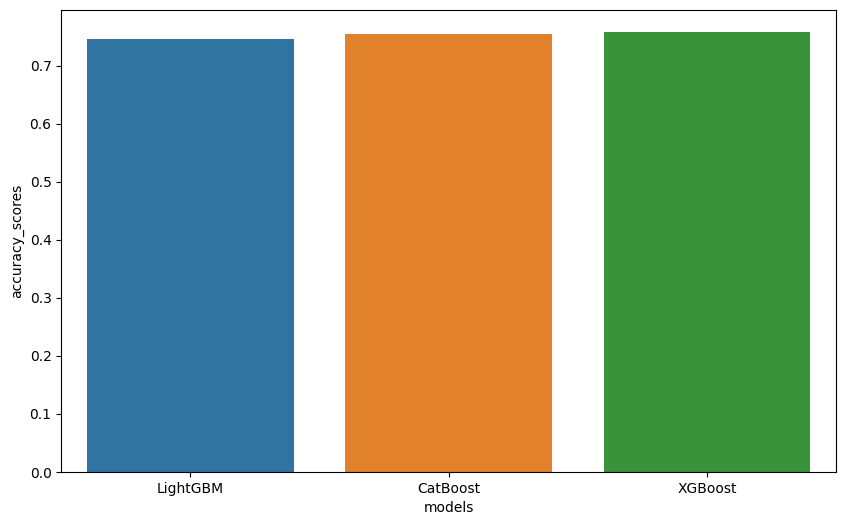

In [ ]:
visual_performance(scores_with_different_models, 'accuracy_scores')

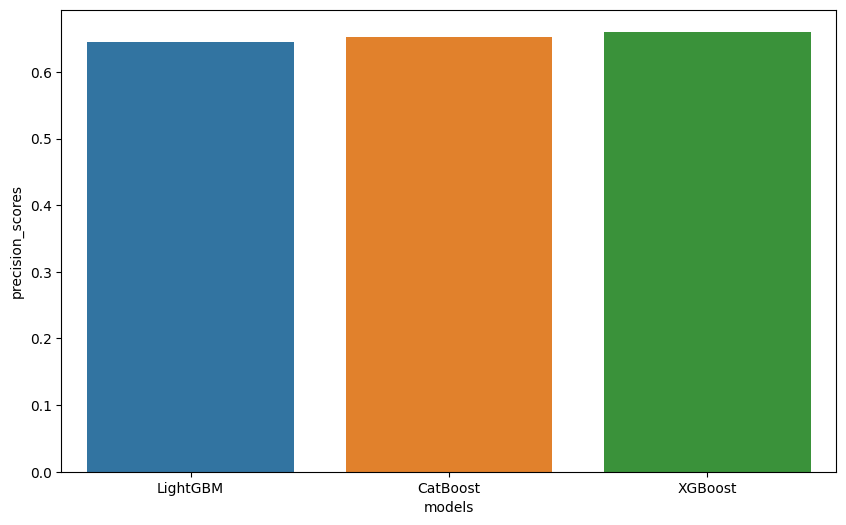

In [ ]:
visual_performance(scores_with_different_models, 'precision_scores')

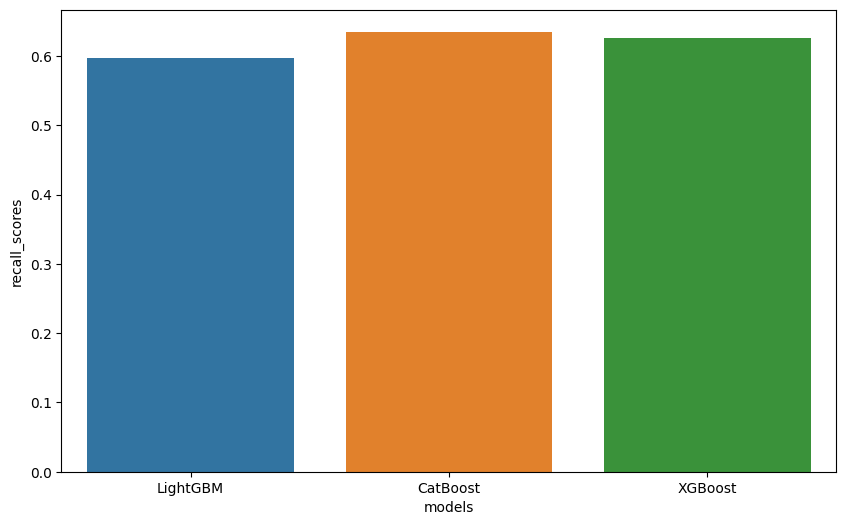

In [ ]:
visual_performance(scores_with_different_models, 'recall_scores')


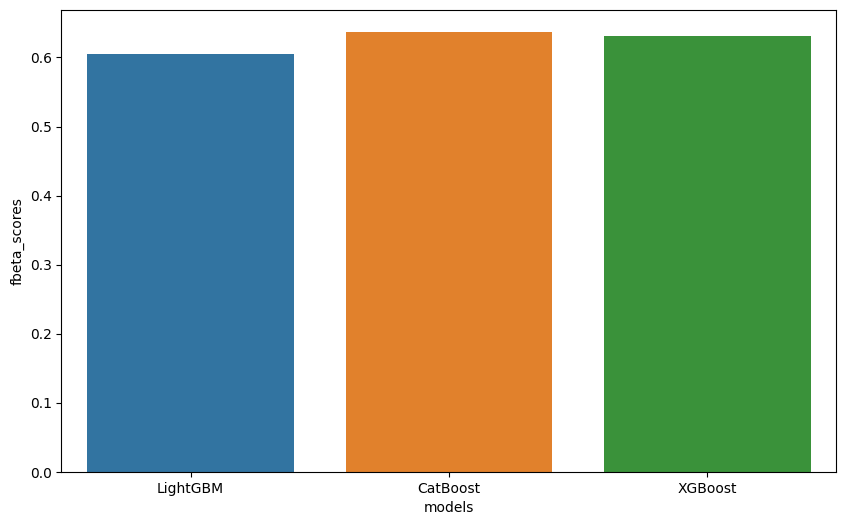

In [ ]:
visual_performance(scores_with_different_models, 'fbeta_scores')

**After all, CatBoost is the winner because i want to focus on recall and fbeta score, we can dig deeper into CatBoost to improve performance**

# Improvement

## Balanced labels in the dataset

As early, this dataset is imbalanced, so i need to apply some techniques to handle with this problem and hope it will help the Catboost model

In [ ]:
ros = RandomOverSampler(random_state=42)
ros.fit(data_train, y_train)
X_resampled, y_resampled = ros.fit_resample(data_train, y_train)

In [ ]:
y_resampled.value_counts()

0    450
1    450
Name: Outcome, dtype: int64

### Retrain

#### Catboost

In [ ]:
catboost_retrain = cb.CatBoostClassifier(**hyperparameters_storage["CatBoost"])
mean_accuracy_retrain, mean_precision_retrain, mean_recall_retrain, mean_fscore_retrain = kfold_training(catboost_retrain, X_resampled, y_resampled)
display_metrics(mean_accuracy_retrain, mean_precision_retrain, mean_recall_retrain, mean_fscore_retrain)

Kết quả truyền trực tuyến bị cắt bớt đến 5000 dòng cuối.
4:	learn: 0.5986781	total: 6.2ms	remaining: 1.23s
5:	learn: 0.5869384	total: 9.88ms	remaining: 1.64s
6:	learn: 0.5790837	total: 13.8ms	remaining: 1.96s
7:	learn: 0.5695705	total: 14.6ms	remaining: 1.81s
8:	learn: 0.5566946	total: 18.7ms	remaining: 2.05s
9:	learn: 0.5482580	total: 22.4ms	remaining: 2.21s
10:	learn: 0.5418139	total: 23.2ms	remaining: 2.09s
11:	learn: 0.5368843	total: 24.1ms	remaining: 1.99s
12:	learn: 0.5258194	total: 24.9ms	remaining: 1.89s
13:	learn: 0.5221826	total: 34ms	remaining: 2.39s
14:	learn: 0.5189756	total: 34.9ms	remaining: 2.29s
15:	learn: 0.5150437	total: 38.7ms	remaining: 2.38s
16:	learn: 0.5107564	total: 42.3ms	remaining: 2.45s
17:	learn: 0.5066507	total: 43ms	remaining: 2.35s
18:	learn: 0.5018585	total: 43.9ms	remaining: 2.26s
19:	learn: 0.4976279	total: 44.7ms	remaining: 2.19s
20:	learn: 0.4969961	total: 45.3ms	remaining: 2.11s
21:	learn: 0.4945794	total: 46.1ms	remaining: 2.05s
22:	learn: 0.49137

#### LightGBM

In [ ]:
lgbmc_retrain = LGBMClassifier(**hyperparameters_storage["LightGBM"])
mean_accuracy_retrain, mean_precision_retrain, mean_recall_retrain, mean_fscore_retrain = kfold_training(lgbmc_retrain, X_resampled, y_resampled)
display_metrics(mean_accuracy_retrain, mean_precision_retrain, mean_recall_retrain, mean_fscore_retrain)

[LightGBM] [Warning] Unknown parameter: max_dept
[LightGBM] [Warning] min_data_in_leaf is set=17, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=17
[LightGBM] [Warning] feature_fraction is set=0.9017214862484344, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9017214862484344
[LightGBM] [Warning] lambda_l2 is set=6.589881400044735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.589881400044735
[LightGBM] [Warning] lambda_l1 is set=4.5542816589141255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5542816589141255
[LightGBM] [Warning] bagging_fraction is set=0.62128226141026, subsample=1.0 will be ignored. Current value: bagging_fraction=0.62128226141026
[LightGBM] [Warning] Unknown parameter: max_dept
[LightGBM] [Warning] min_data_in_leaf is set=17, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=17
[LightGBM] [Warning] feature_fraction is set=0.9017214862484344, colsample_bytree=1.0 will be ig

#### XGBoost

In [ ]:
xgb_retrain = xgboost.XGBClassifier(**hyperparameters_storage["XGBoost"])
mean_accuracy_retrain, mean_precision_retrain, mean_recall_retrain, mean_fscore_retrain = kfold_training(xgb_retrain, X_resampled, y_resampled)
display_metrics(mean_accuracy_retrain, mean_precision_retrain, mean_recall_retrain, mean_fscore_retrain)

Accuracy: 0.83111
Precision: 0.79982
Recall: 0.88444
Fbeta_score: 0.86893


## Train on full of training set and evaluate on test set

In [ ]:
catboost = cb.CatBoostClassifier(**hyperparameters_storage["CatBoost"])
catboost.fit(X_resampled, y_resampled)
y_predict = catboost.predict(data_test)
accuracy, precision, recall, f_score = metrics(y_test, y_predict)
display_metrics(mean_accuracy, mean_precision, mean_recall, mean_fscore)
print(classification_report(y_pred=y_predict, y_true=y_test))

0:	learn: 0.6649790	total: 844us	remaining: 844ms
1:	learn: 0.6455730	total: 2.32ms	remaining: 1.16s
2:	learn: 0.6256112	total: 3.74ms	remaining: 1.24s
3:	learn: 0.6120034	total: 4.51ms	remaining: 1.12s
4:	learn: 0.6017652	total: 6.2ms	remaining: 1.23s
5:	learn: 0.5927284	total: 7.8ms	remaining: 1.29s
6:	learn: 0.5851086	total: 9.59ms	remaining: 1.36s
7:	learn: 0.5704525	total: 10.8ms	remaining: 1.34s
8:	learn: 0.5566500	total: 12ms	remaining: 1.32s
9:	learn: 0.5487512	total: 13ms	remaining: 1.29s
10:	learn: 0.5424148	total: 14.1ms	remaining: 1.27s
11:	learn: 0.5374228	total: 15.2ms	remaining: 1.25s
12:	learn: 0.5283554	total: 16.4ms	remaining: 1.24s
13:	learn: 0.5243287	total: 17.5ms	remaining: 1.23s
14:	learn: 0.5175925	total: 18.7ms	remaining: 1.23s
15:	learn: 0.5140535	total: 19.8ms	remaining: 1.22s
16:	learn: 0.5107587	total: 20.9ms	remaining: 1.21s
17:	learn: 0.5051573	total: 21.9ms	remaining: 1.19s
18:	learn: 0.5013100	total: 23ms	remaining: 1.19s
19:	learn: 0.4978086	total: 24m

# Save models

In [ ]:
joblib.dump(catboost, "/content/model_0.8518518518518519.pkl")

['model.pkl']

In [ ]:
clf = joblib.load(f"/content/model_0.8518518518518519.pkl")
y_predict = clf.predict(data_test)
accuracy, precision, recall, f_score = metrics(y_test, y_predict)
display_metrics(accuracy, precision, recall, f_score)

Accuracy: 0.71429
Precision: 0.56098
Recall: 0.85185
Fbeta_score: 0.78409


In [ ]:
!pip list | grep catboost

catboost                         1.2.1
